---


1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>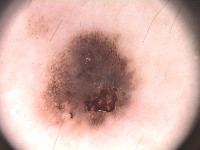</td><td>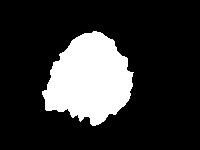</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [ ]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

--2023-01-03 10:03:13--  https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/8lqrloi0mxj2acu/PH2Dataset.rar [following]
--2023-01-03 10:03:13--  https://www.dropbox.com/s/raw/8lqrloi0mxj2acu/PH2Dataset.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucfea024be4cce4b8315bb739b58.dl.dropboxusercontent.com/cd/0/inline/Bz3JV_16OqZqlGKVxKSlJJw_Bb5OYh1iDcZ-da7WVgAnEMHfNtZdhbSLKAO0y1UIdtRoUnjraa3-hY4BxLmjFe1zZdwrtKtZSCxqfvE960DJCA2pzJJgx4mHGED-9rv7SucBM7wGcWJ24vCzyWxDoW8jW1zQpdn32O1iqUrjohBJow/file# [following]
--2023-01-03 10:03:13--  https://ucfea024be4cce4b8315bb739b58.dl.dropboxusercontent.com/cd/0/inline/Bz3JV_16OqZqlGKVxKSlJJw_Bb5OYh1iDcZ-da7WVgAnEMHfNtZdhbSLKAO0y1UIdtRoUnj

In [ ]:
!ls

PH2Dataset.rar	sample_data


In [ ]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [ ]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [ ]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [ ]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [ ]:
len(lesions)

200

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

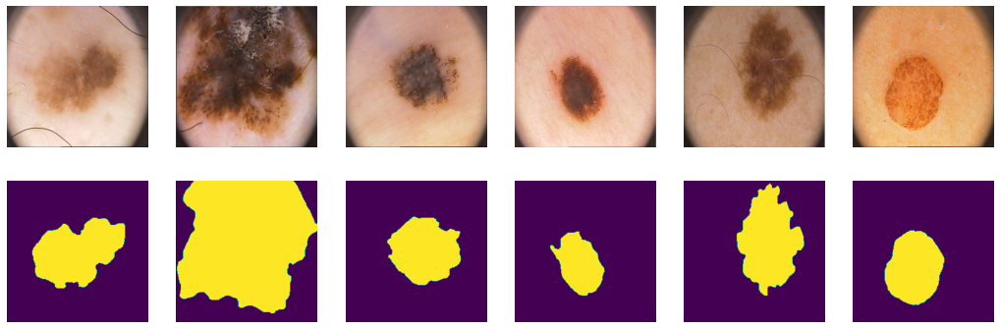

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [ ]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [ ]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 160])

In [ ]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [ ]:
from torch.utils.data import DataLoader
batch_size = 16
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])), 
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [ ]:
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=10, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=10, shuffle=True)

In [ ]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

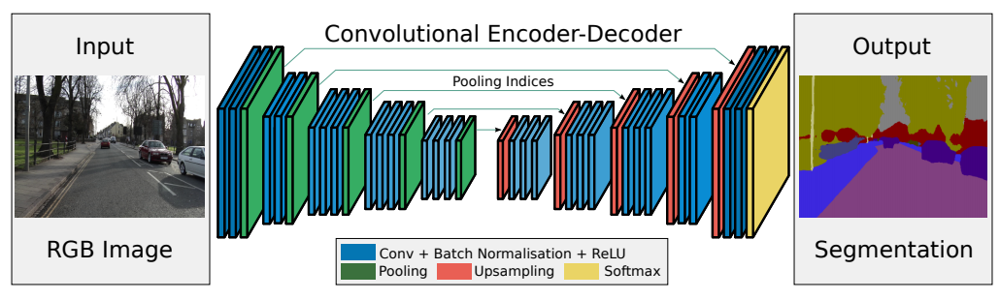

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [ ]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU()
        )
        self.pool3 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU()
        )

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU()
        )
        self.upsample1 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU()
        )
        self.upsample2 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU()
        )
        self.upsample3 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 1, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(num_features = 1),
            #nn.ReLU()
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e0_pool, e0_ind = self.pool0(e0)
        e1 = self.enc_conv1(e0_pool)
        e1_pool, e1_ind = self.pool1(e1)
        e2 = self.enc_conv2(e1_pool)
        e2_pool, e2_ind = self.pool2(e2)
        e3 = self.enc_conv3(e2_pool)
        e3_pool, e3_ind = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(e3_pool)

        # decoder
        d0 = self.upsample0(b, e3_ind)
        d0_conv = self.dec_conv0(d0)
        d1 = self.upsample1(d0_conv, e2_ind)
        d1_conv = self.dec_conv1(d1)
        d2 = self.upsample2(d1_conv, e1_ind)
        d2_conv = self.dec_conv2(d2)
        d3 =  self.upsample3(d2_conv, e0_ind)
        d3_conv = self.dec_conv3(d3) # no activation
        return d3_conv

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [ ]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return iou  # 

## Функция потерь [1 балл]

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации. 

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [ ]:
def bce_loss(y_real, y_pred):
    #return y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred))
    return torch.mean(y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred)))
    # TODO 
    # please don't use nn.BCELoss. write it from scratch

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [ ]:
def train(model, opt, loss_fn, epochs, data_tr, data_val):
    #X_val, Y_val = next(iter(data_val))

    losses_train = []
    losses_val = []
    scores_train = []
    scores_val = []

    score_val_best = -1.0

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        loss_train = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred) # forward-pass
            loss.backward() # backward-pass
            opt.step()  # update weights
            # calculate loss to show the user
            loss_train += loss.item() / len(data_tr)

        score_train = score_model(model, iou_pytorch, data_tr, 'cuda')

        toc = time()
        print(f'loss_train = {loss_train}, score_train = {score_train}')

        losses_train.append(loss_train)
        scores_train.append(score_train)

        # show intermediate results
        
        model.eval()  # testing mode
        Y_hat = torch.zeros(size=(0, 1, 256, 256))
        X_val = torch.zeros(size=(0, 3, 256, 256))

        loss_val = 0
        with torch.no_grad():
            for X_batch, Y_batch in data_val:
                #print(X_val.shape, X_batch.shape)
                X_val = torch.concat((X_val, X_batch), axis=0)
                #X_val, Y_val = X_batch, Y_batch
                X_batch = X_batch.to(device)
                Y_pred = model(X_batch).cpu()
                #Y_iou = nn.Sigmoid()(Y_pred)
                #Y_iou[Y_iou > 0.5] = 1
                #Y_iou[Y_iou <= 0.5] = 0
                #print(type(Y_hat), type(Y_pred))
                #print(Y_hat.shape, Y_pred.shape)
                Y_hat = torch.concat((Y_hat, Y_pred), axis=0)
                loss = loss_fn(Y_batch, Y_pred) # forward-pass
                loss_val += loss.item() / len(data_val)
                #score_val += iou_pytorch(Y_iou, Y_batch).mean()
        # Visualize tools
        #val_score /= len(data_val)

        score_val = score_model(model, iou_pytorch, data_val, 'cuda')

        if score_val_best < score_val:
            score_val_best = score_val
            model_best_weights = model.state_dict()

        print(f'loss_val= {loss_val}, score_val = {score_val}')
        losses_val.append(loss_val)
        scores_val.append(score_val)
    
        #clear_output(wait=True)
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray')
            plt.title('Output')
            plt.axis('off')
        plt.suptitle(f'{epoch+1} / {epochs}: loss_train = {loss_train}, score_train = {score_train}, loss_val = {loss_val}, score_val = {score_val}')
        plt.show()
    
    model.load_state_dict(model_best_weights)

    return losses_train, scores_train, losses_val, scores_val

In [ ]:
def train(model, opt, loss_fn, epochs, data_tr, data_val):
    #X_val, Y_val = next(iter(data_val))

    losses_train = []
    losses_val = []
    scores_train = []
    scores_val = []

    score_val_best = -1.0

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        loss_train = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred) # forward-pass
            loss.backward() # backward-pass
            opt.step()  # update weights
            # calculate loss to show the user
            loss_train += loss.item() / len(data_tr)

        score_train = score_model(model, iou_pytorch, data_tr, 'cuda')

        toc = time()
        print(f'loss_train = {loss_train}, score_train = {score_train}')

        losses_train.append(loss_train)
        scores_train.append(score_train)

        # show intermediate results
        
        model.eval()  # testing mode
        
        X_val = torch.zeros(size=(0, 3, 256, 256))
        Y_hat = torch.zeros(size=(0, 1, 256, 256))
        Y_hat_contrast = torch.zeros(size=(0, 1, 256, 256))
        Y_hat_real = torch.zeros(size=(0, 1, 256, 256))

        loss_val = 0
        with torch.no_grad():
            for X_batch, Y_batch in data_val:
                #print(X_val.shape, X_batch.shape)
                X_val = torch.concat((X_val, X_batch), axis=0)
                #X_val, Y_val = X_batch, Y_batch
                X_batch = X_batch.to(device)
                Y_pred = model(X_batch).cpu()
                #Y_iou = nn.Sigmoid()(Y_pred)
                #Y_iou[Y_iou > 0.5] = 1
                #Y_iou[Y_iou <= 0.5] = 0
                #print(type(Y_hat), type(Y_pred))
                #print(Y_hat.shape, Y_pred.shape)
                Y_hat = torch.concat((Y_hat, Y_pred), axis=0)
                Y_hat_real = torch.concat((Y_hat_real, Y_batch), axis=0)

                Y_iou = nn.Sigmoid()(Y_pred)
                Y_iou[Y_iou > 0.5] = 1
                Y_iou[Y_iou <= 0.5] = 0
                Y_hat_contrast = torch.concat((Y_hat_contrast, Y_iou), axis=0)

                loss = loss_fn(Y_batch, Y_pred) # forward-pass
                loss_val += loss.item() / len(data_val)
                #score_val += iou_pytorch(Y_iou, Y_batch).mean()
        # Visualize tools
        #val_score /= len(data_val)

        score_val = score_model(model, iou_pytorch, data_val, 'cuda')

        if score_val_best < score_val:
            score_val_best = score_val
            model_best_weights = model.state_dict()

        print(f'loss_val= {loss_val}, score_val = {score_val}')
        losses_val.append(loss_val)
        scores_val.append(score_val)
    
        #clear_output(wait=True)

        plt.figure(figsize = (18,12))

        for k in range(6):
            plt.subplot(4, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(4, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray')
            plt.title('Output')
            plt.axis('off')

            plt.subplot(4, 6, k+13)
            plt.imshow(Y_hat_contrast[k, 0], cmap='gray')
            plt.title('Masked')
            plt.axis('off')

            plt.subplot(4, 6, k+19)
            plt.imshow(Y_hat_real[k, 0], cmap='gray')
            plt.title('Real')
            plt.axis('off')

        plt.suptitle(f'{epoch+1} / {epochs}: loss_train = {loss_train}, score_train = {score_train}, loss_val = {loss_val}, score_val = {score_val}')
        plt.show()
    
    model.load_state_dict(model_best_weights)

    return losses_train, scores_train, losses_val, scores_val

In [ ]:
def train(model, opt, sheduler, loss_fn, epochs, data_tr, data_val):
    #X_val, Y_val = next(iter(data_val))

    losses_train = []
    losses_val = []
    scores_train = []
    scores_val = []

    score_val_best = -1.0

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        loss_train = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred) # forward-pass
            loss.backward() # backward-pass
            opt.step()  # update weights
            scheduler.step()
            # calculate loss to show the user
            loss_train += loss.item() / len(data_tr)

        score_train = score_model(model, iou_pytorch, data_tr, 'cuda')

        toc = time()
        print(f'loss_train = {loss_train}, score_train = {score_train}')

        losses_train.append(loss_train)
        scores_train.append(score_train)

        # show intermediate results
        
        model.eval()  # testing mode
        
        X_val = torch.zeros(size=(0, 3, 256, 256))
        Y_hat = torch.zeros(size=(0, 1, 256, 256))
        Y_hat_contrast = torch.zeros(size=(0, 1, 256, 256))
        Y_hat_real = torch.zeros(size=(0, 1, 256, 256))

        loss_val = 0
        with torch.no_grad():
            for X_batch, Y_batch in data_val:
                #print(X_val.shape, X_batch.shape)
                X_val = torch.concat((X_val, X_batch), axis=0)
                #X_val, Y_val = X_batch, Y_batch
                X_batch = X_batch.to(device)
                Y_pred = model(X_batch).cpu()
                #Y_iou = nn.Sigmoid()(Y_pred)
                #Y_iou[Y_iou > 0.5] = 1
                #Y_iou[Y_iou <= 0.5] = 0
                #print(type(Y_hat), type(Y_pred))
                #print(Y_hat.shape, Y_pred.shape)
                Y_hat = torch.concat((Y_hat, Y_pred), axis=0)
                Y_hat_real = torch.concat((Y_hat_real, Y_batch), axis=0)

                Y_iou = nn.Sigmoid()(Y_pred)
                Y_iou[Y_iou > 0.5] = 1
                Y_iou[Y_iou <= 0.5] = 0
                Y_hat_contrast = torch.concat((Y_hat_contrast, Y_iou), axis=0)

                loss = loss_fn(Y_batch, Y_pred) # forward-pass
                loss_val += loss.item() / len(data_val)
                #score_val += iou_pytorch(Y_iou, Y_batch).mean()
        # Visualize tools
        #val_score /= len(data_val)

        score_val = score_model(model, iou_pytorch, data_val, 'cuda')

        if score_val_best < score_val:
            score_val_best = score_val
            model_best_weights = model.state_dict()

        print(f'loss_val= {loss_val}, score_val = {score_val}')
        losses_val.append(loss_val)
        scores_val.append(score_val)
    
        #clear_output(wait=True)

        plt.figure(figsize = (18,12))

        for k in range(6):
            plt.subplot(4, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(4, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray')
            plt.title('Output')
            plt.axis('off')

            plt.subplot(4, 6, k+13)
            plt.imshow(Y_hat_contrast[k, 0], cmap='gray')
            plt.title('Masked')
            plt.axis('off')

            plt.subplot(4, 6, k+19)
            plt.imshow(Y_hat_real[k, 0], cmap='gray')
            plt.title('Real')
            plt.axis('off')

        plt.suptitle(f'{epoch+1} / {epochs}: loss_train = {loss_train}, score_train = {score_train}, loss_val = {loss_val}, score_val = {score_val}')
        plt.show()
    
    model.load_state_dict(model_best_weights)

    return losses_train, scores_train, losses_val, scores_val

## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [ ]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = [ X_batch for X_batch, _ in data]
    return np.array(Y_pred)

In [ ]:
def score_model(model, metric, data, device):
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data:
        Y_pred = model(X_batch.to(device))
        Y_iou = nn.Sigmoid()(Y_pred)
        Y_iou[Y_iou > 0.5] = 1
        Y_iou[Y_iou <= 0.5] = 0
        scores += metric(Y_iou, Y_label.to(device)).mean().item()
    return scores/len(data)

In [ ]:
def score_model(model, metric, data, device):
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data:
        Y_pred = model(X_batch.to(device))
        Y_pred = nn.Sigmoid()(Y_pred)
        scores += metric(Y_pred.round(), Y_label.to(device)).mean().item()
    return scores/len(data)

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [ ]:
model = SegNet().to(device)
#model

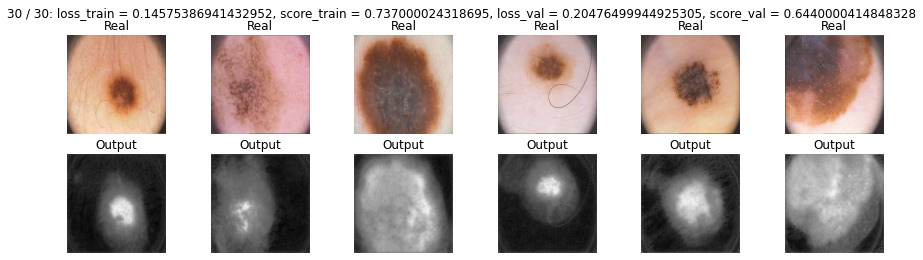

In [ ]:
max_epochs = 30
optim = torch.optim.Adam(model.parameters(), lr=0.001)
losses_train, scores_train, losses_val, scores_val = train(model, optim, bce_loss, max_epochs, data_tr, data_val)

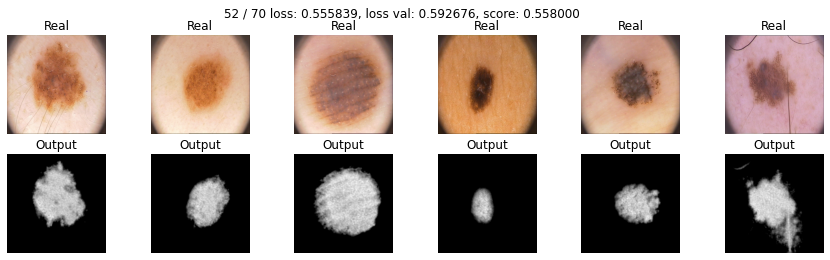

* Epoch 53/70


KeyboardInterrupt: ignored

In [ ]:
max_epochs = 70
optim = torch.optim.Adam(model.parameters(), lr=0.001)
train(model, optim, bce_loss, max_epochs, data_tr, data_val)

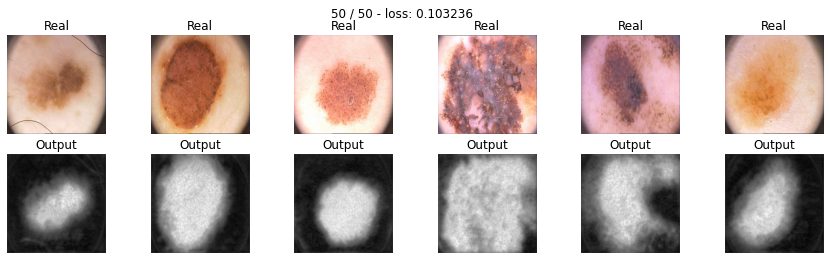

In [ ]:
max_epochs = 50
optim = torch.optim.Adam(model.parameters(), lr=0.001)
train(model, optim, bce_loss, max_epochs, data_tr, data_val)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
score_model(model, iou_pytorch, data_ts, device)

0.5780000329017639

In [ ]:
for i in range(20):
    losses_train[i] = losses_train[i].detach().cpu()
    #scores_train[i] = scores_train[i].cpu()
    losses_val[i] = losses_val[i].detach().cpu()
    #scores_val[i] = scores_val[i].cpu()

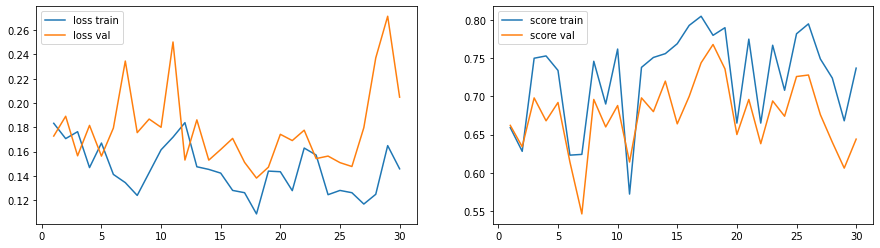

In [ ]:
plt_epochs = range(1,max_epochs+1)
fig, ax = plt.subplots(1,2, sharex = True)

ax[0].plot(plt_epochs, losses_train, label = 'loss train')
ax[0].plot(plt_epochs, losses_val, label = 'loss val')
ax[0].legend()
ax[1].plot(plt_epochs, scores_train, label = 'score train')
ax[1].plot(plt_epochs, scores_val, label = 'score val')
ax[1].legend()
plt.show()

In [ ]:
#score_model(model, iou_pytorch, data_val)


model.eval()  # testing mode
scores = 0
for X_batch, Y_label in data_ts:
    X_batch = X_batch.to(device)
    Y_pred = model(X_batch).cpu()
    Y_iou = torch.sigmoid(Y_pred)
    scores += iou_pytorch(Y_iou.round(), Y_label).mean().item()

scores = scores/len(data_val)
print(scores)

0.55


Ответьте себе на вопрос: не переобучается ли моя модель?

-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла] 

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss. 
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


In [ ]:
def dice_loss(y_real, y_pred):
    y_pred = torch.sigmoid(y_pred)
    num = 2 * y_real * y_pred
    den = y_real + y_pred
    res = 1 - torch.sum(num / den) / (256 * 256)
    return res

Проводим тестирование:

In [ ]:
model_dice = SegNet().to(device)

In [ ]:
max_epochs = 40
optimizer = torch.optim.Adam(model_dice.parameters())
losses_train_dice, scores_train_dice, losses_val_dice, scores_val_dice = train(model_dice, optimizer, dice_loss, max_epochs, data_tr, data_val)

In [ ]:
score_model(model_dice, iou_pytorch, data_val)

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf) 

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [ ]:
def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
    y_pred = torch.clamp(torch.sigmoid(y_pred), eps, 1.0 - eps) # hint: torch.clamp
    y_pred_sigmoid = torch.sigmoid(y_pred)
    loss_a = ((1 - y_pred_sigmoid) ** gamma) * y_real * torch.log(y_pred_sigmoid + eps)
    loss_b = (1 - y_real) * torch.log(1.0 - y_pred_sigmoid + eps)
    loss = -torch.sum(loss_a + loss_b)
    return loss

In [ ]:
model_focal = SegNet().to(device)

In [ ]:
max_epochs = 20
optimizer_focal = torch.optim.Adam(model_focal.parameters())
losses_train_dice, scores_train_dice, losses_val_dice, scores_val_dice = train(model_focal, optimizer_focal, focal_loss, max_epochs, data_tr, data_val)

In [ ]:
score_model(model_focal, iou_pytorch, data_val)

-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

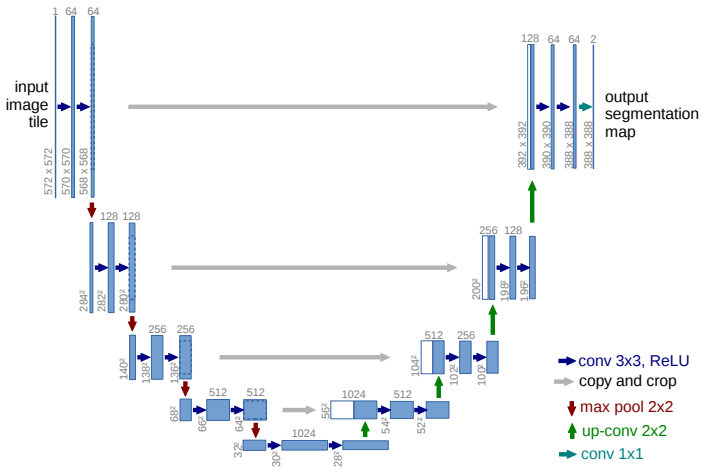

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [ ]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
        )
        self.pool2 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
        )
        self.pool3 = nn.MaxPool2d(kernel_size = 2, stride = 2, return_indices = True) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 1024),
            nn.ReLU(),
            nn.Conv2d(1024, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
        )

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU()
        )
        self.upsample1 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU()
        )
        self.upsample2 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU()
        )
        self.upsample3 = nn.MaxUnpool2d(kernel_size = 2, stride = 2) # 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 1, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 1),
            #nn.ReLU()
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e0_pool, e0_ind = self.pool0(e0)
        e1 = self.enc_conv1(e0_pool)
        e1_pool, e1_ind = self.pool1(e1)
        e2 = self.enc_conv2(e1_pool)
        e2_pool, e2_ind = self.pool2(e2)
        e3 = self.enc_conv3(e2_pool)
        e3_pool, e3_ind = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(e3_pool)

        # decoder
        d0 = self.upsample0(b, e3_ind)
        d0_conv = self.dec_conv0(torch.concat((d0, e3), axis=1))
        d1 = self.upsample1(d0_conv, e2_ind)
        d1_conv = self.dec_conv1(torch.concat((d1, e2), axis=1))
        d2 = self.upsample2(d1_conv, e1_ind)
        d2_conv = self.dec_conv2(torch.concat((d2, e1), axis=1))
        d3 = self.upsample3(d2_conv, e0_ind)
        d3_conv = self.dec_conv3(torch.concat((d3, e0), axis=1)) # no activation
        return d3_conv

In [ ]:
unet_model = UNet().to(device)

* Epoch 1/30
loss_train = 0.5523721149989537, score_train = 1.0141498908884212e-05
loss_val= 0.641999626159668, score_val = 2.2133205987594845e-06


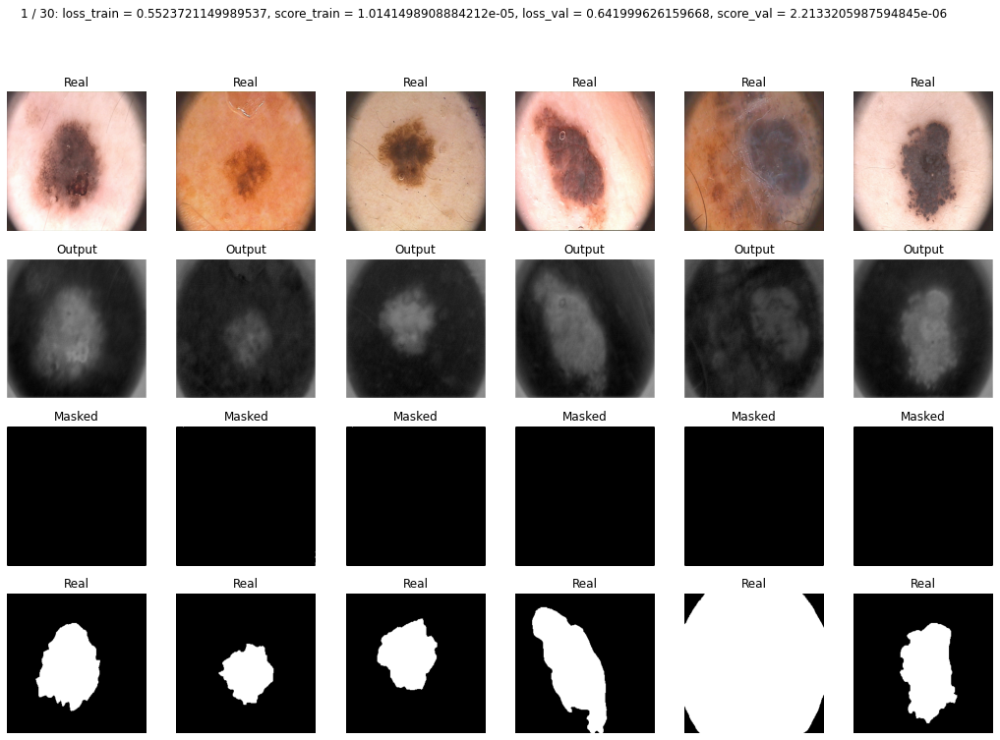

* Epoch 2/30
loss_train = 0.4558286879743848, score_train = 0.021714057698383322
loss_val= 0.6084740281105041, score_val = 0.019830192858353256


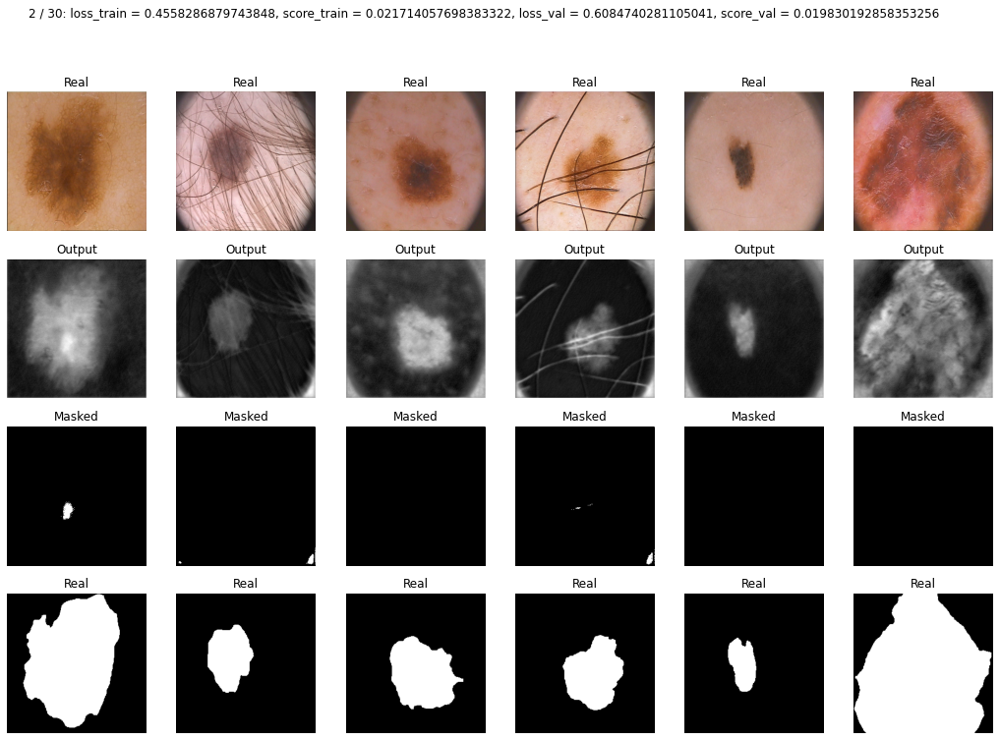

* Epoch 3/30
loss_train = 0.42977463773318697, score_train = 0.15389592626265117
loss_val= 0.5591894388198853, score_val = 0.18010725378990172


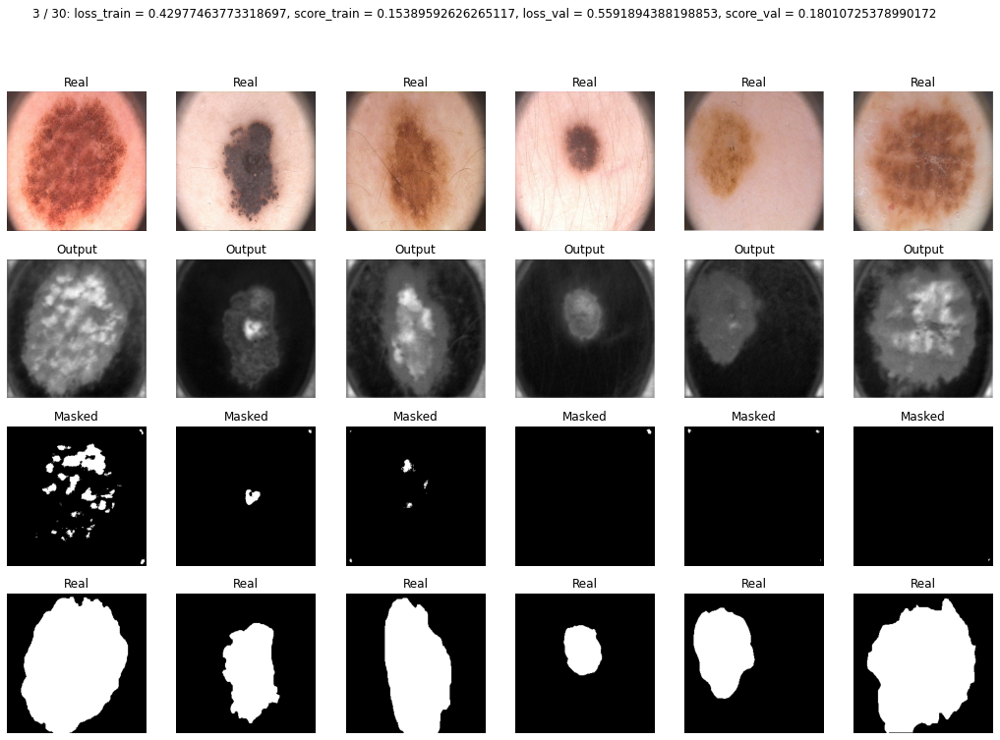

* Epoch 4/30
loss_train = 0.42402351328304844, score_train = 0.16945154539176396
loss_val= 0.5610148906707764, score_val = 0.17471541166305543


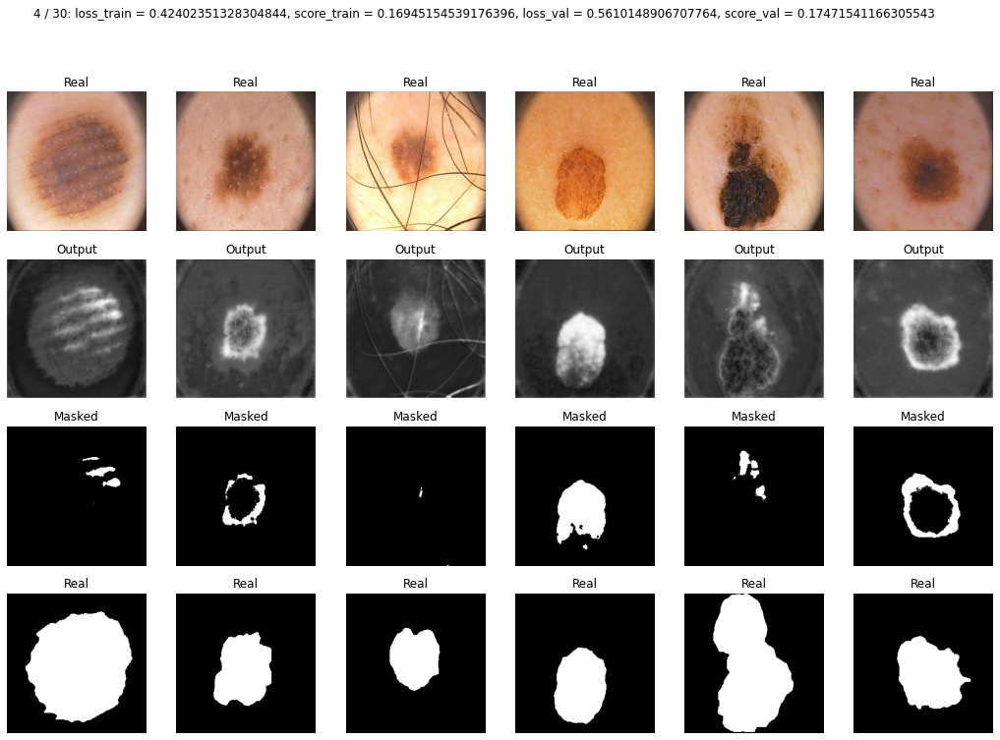

* Epoch 5/30
loss_train = 0.4276920642171587, score_train = 0.6240329742431641
loss_val= 0.4382735013961792, score_val = 0.6482299923896789


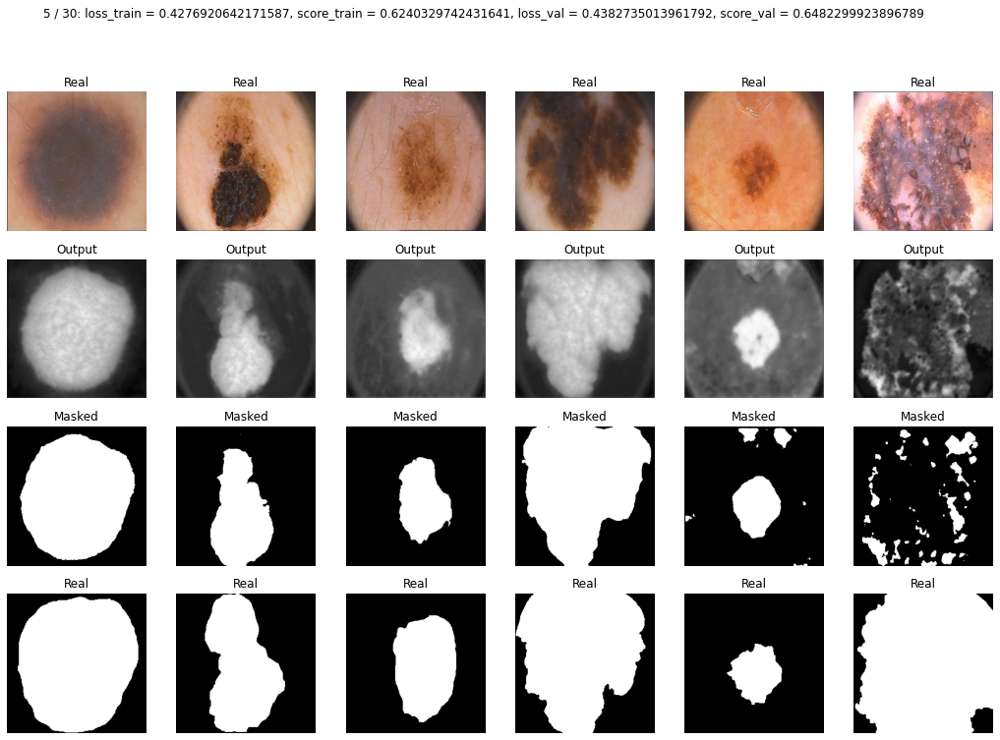

* Epoch 6/30
loss_train = 0.4356282949447632, score_train = 0.6196919764791217
loss_val= 0.46374445557594296, score_val = 0.6575629591941834


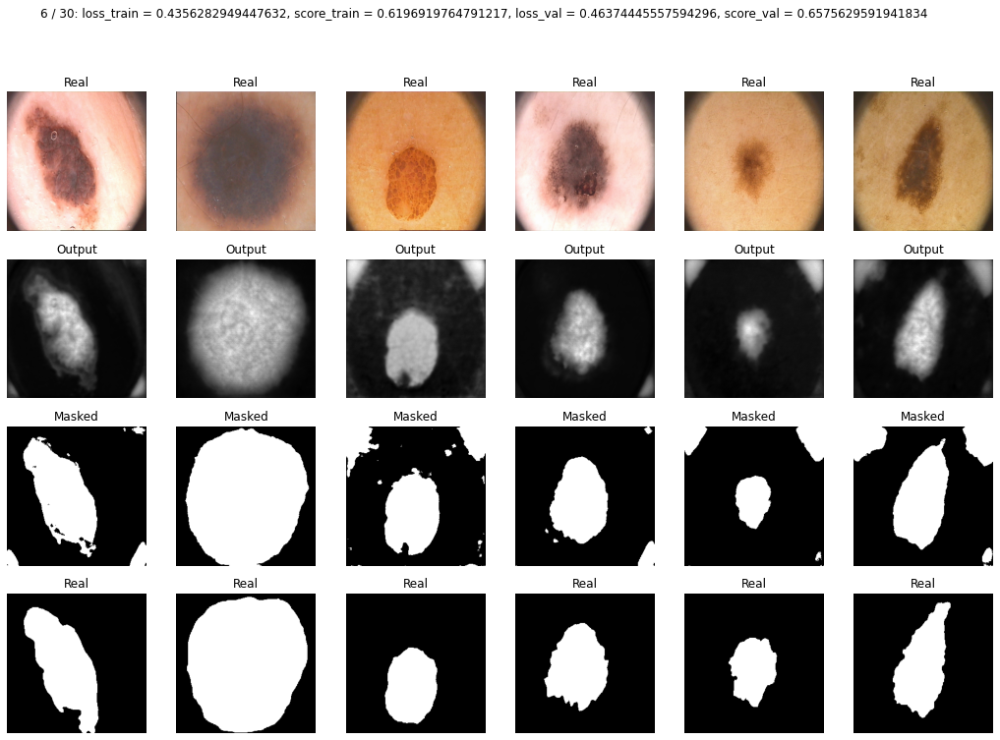

* Epoch 7/30
loss_train = 0.43387342776571003, score_train = 0.7059399144990104
loss_val= 0.4270471930503845, score_val = 0.7451944947242737


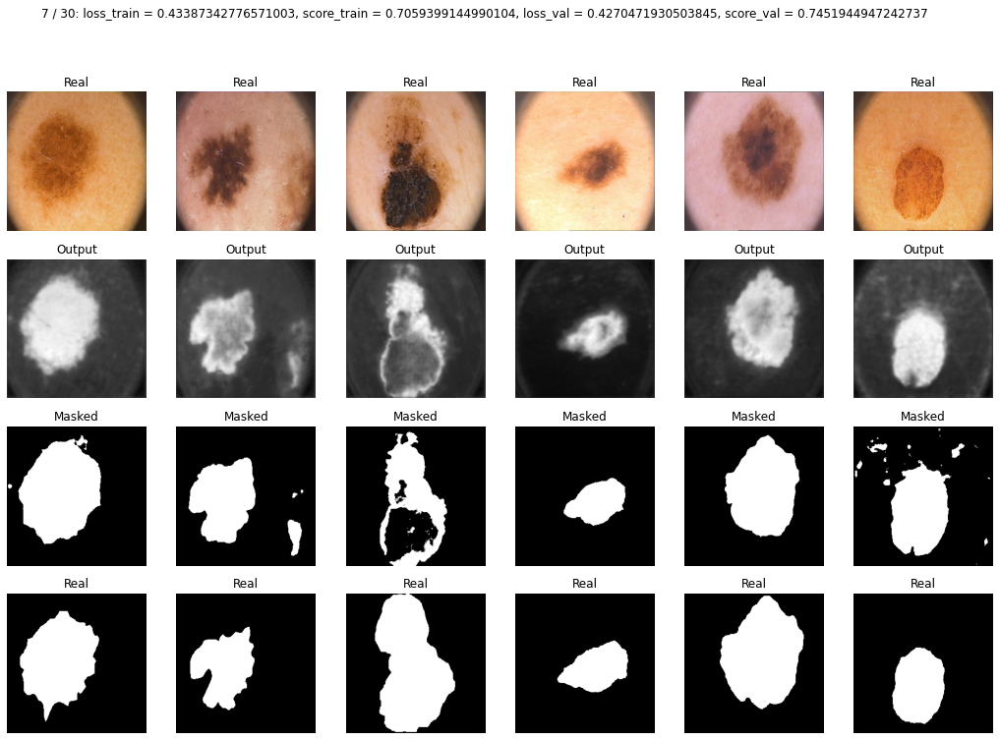

* Epoch 8/30
loss_train = 0.41184932844979427, score_train = 0.7819871647017342
loss_val= 0.4144815504550934, score_val = 0.7652507424354553


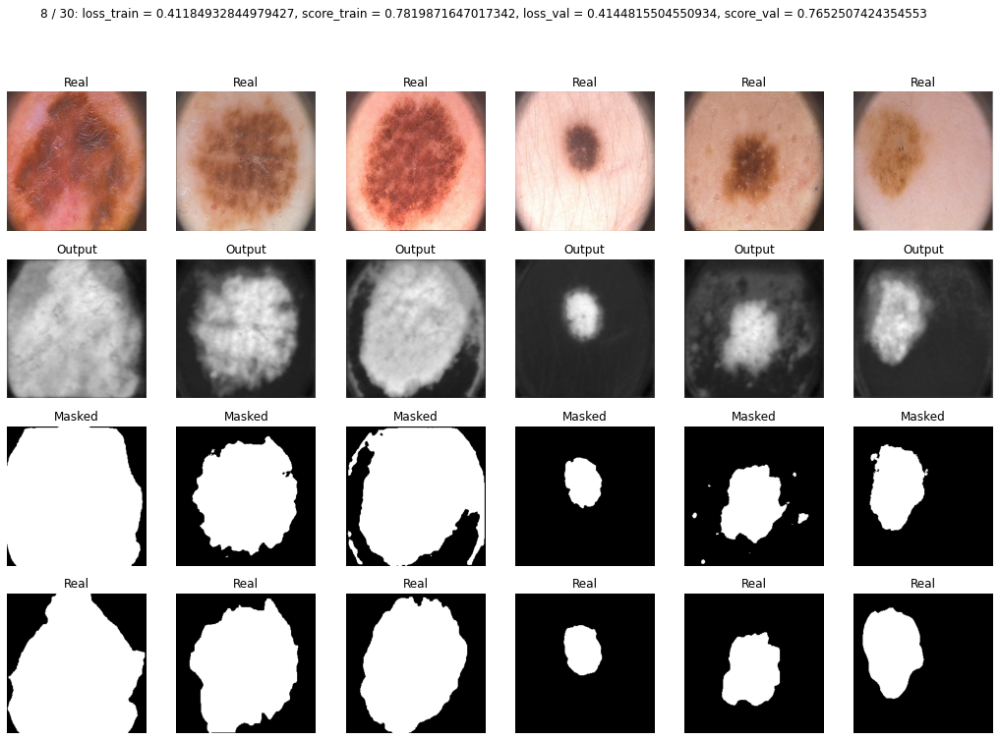

* Epoch 9/30
loss_train = 0.40628560951777876, score_train = 0.3509280468736376
loss_val= 0.5441999733448029, score_val = 0.30234879851341245


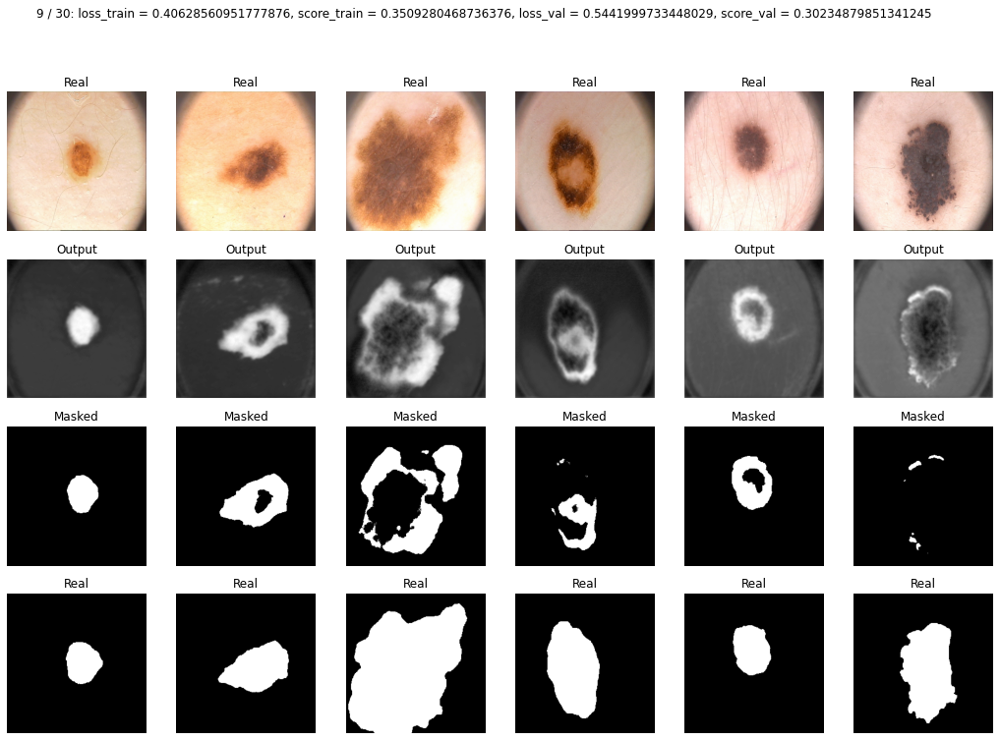

* Epoch 10/30
loss_train = 0.40680988345827374, score_train = 0.6106298736163548
loss_val= 0.4750456571578979, score_val = 0.6106115102767944


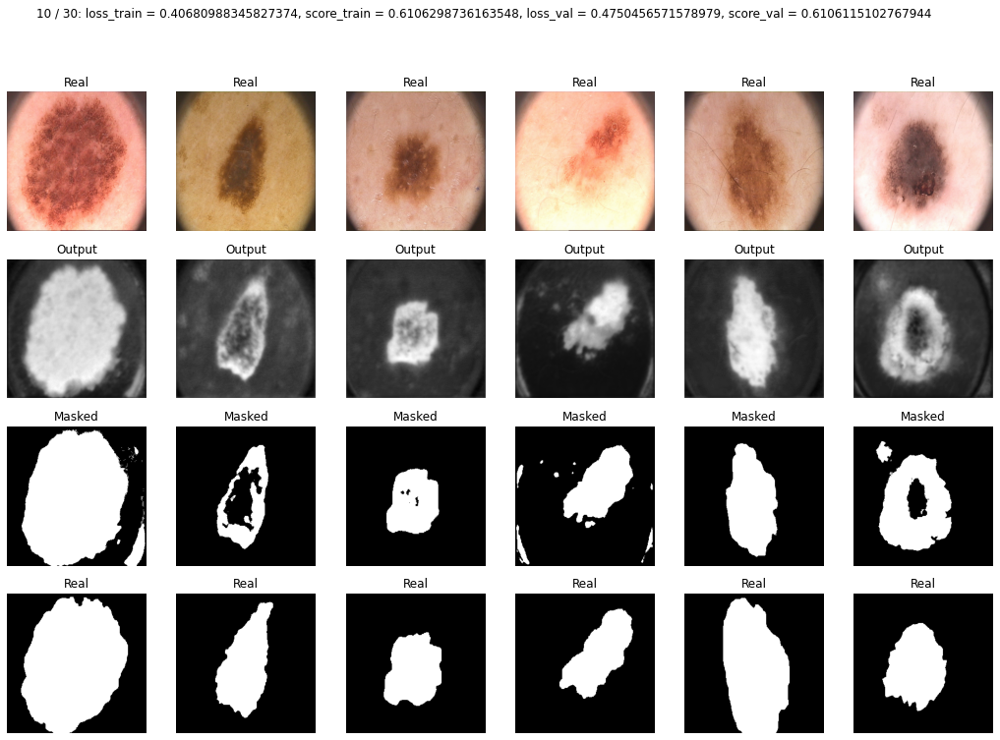

* Epoch 11/30
loss_train = 0.4011402130126953, score_train = 0.6680457847458976
loss_val= 0.47625361680984496, score_val = 0.6671973586082458


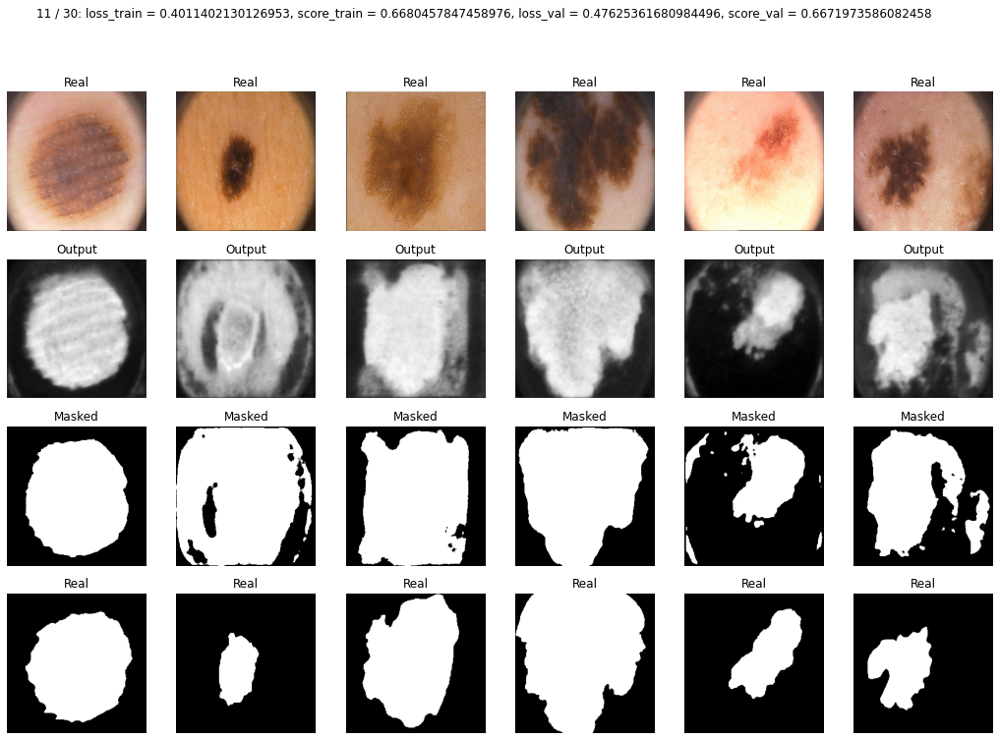

* Epoch 12/30
loss_train = 0.38896796107292175, score_train = 0.7570109282221112
loss_val= 0.39475707411766053, score_val = 0.7667747974395752


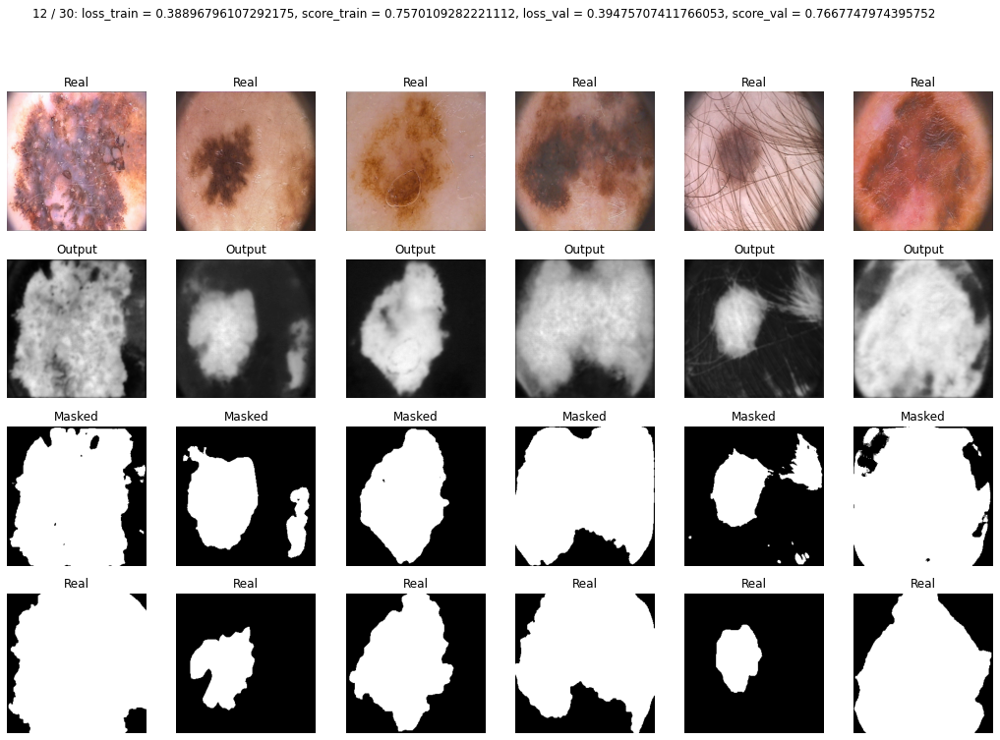

* Epoch 13/30
loss_train = 0.3893903877053942, score_train = 0.76454929794584
loss_val= 0.44243022203445437, score_val = 0.7344013810157776


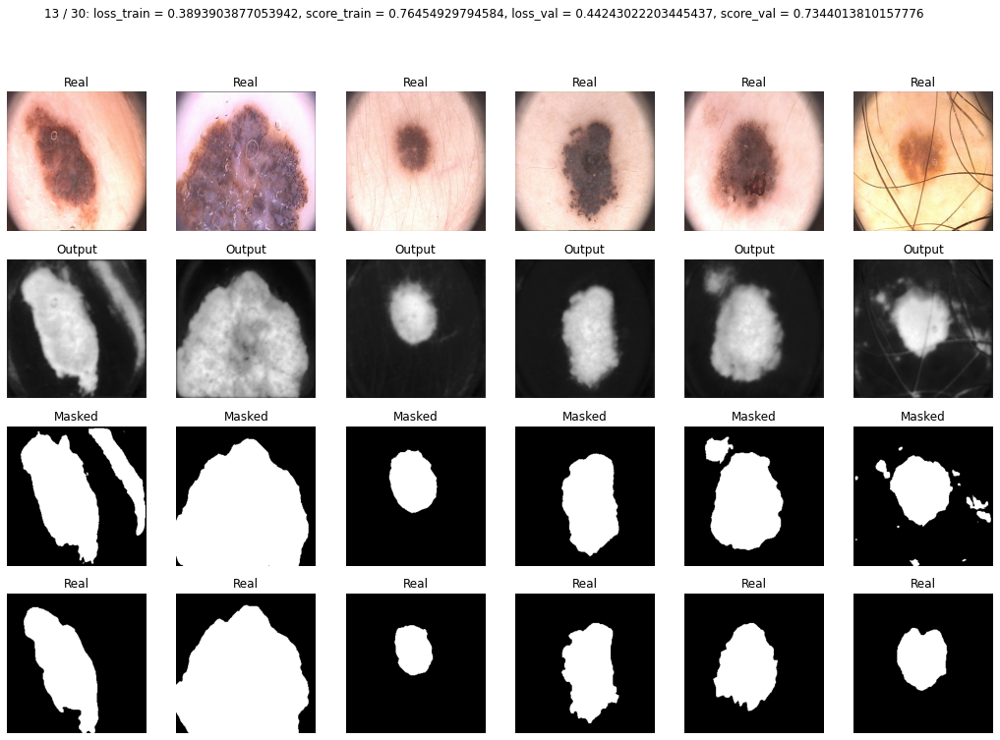

* Epoch 14/30
loss_train = 0.3759140116827829, score_train = 0.7973325337682452
loss_val= 0.35897130370140073, score_val = 0.8122461438179016


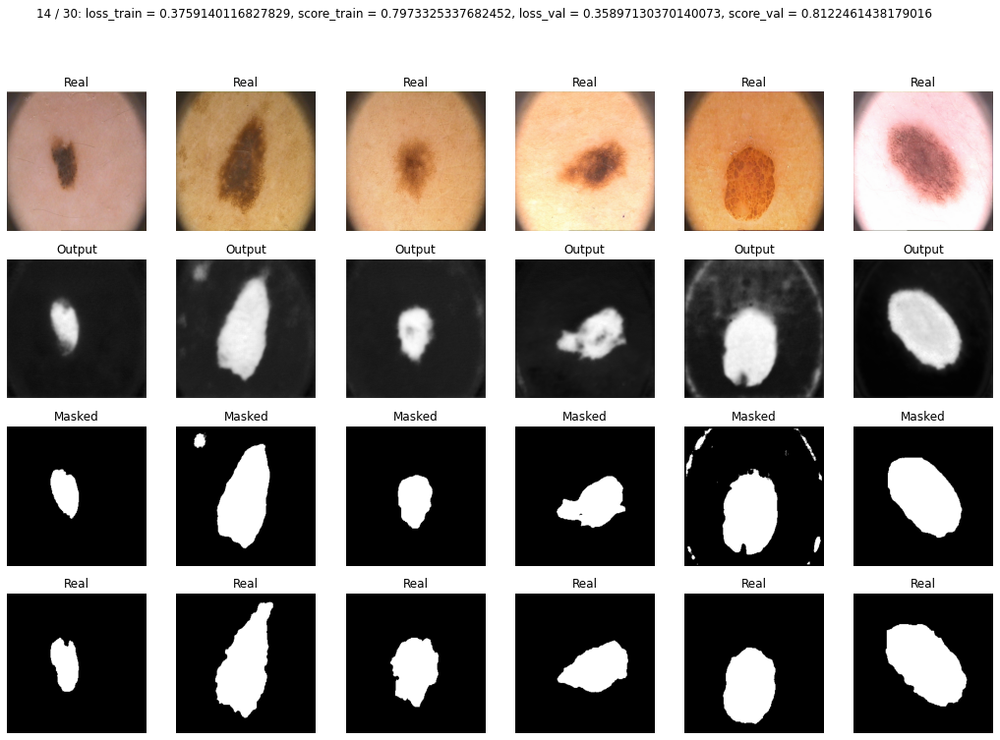

* Epoch 15/30
loss_train = 0.37615461434636793, score_train = 0.7094058820179531
loss_val= 0.44551897048950195, score_val = 0.681341540813446


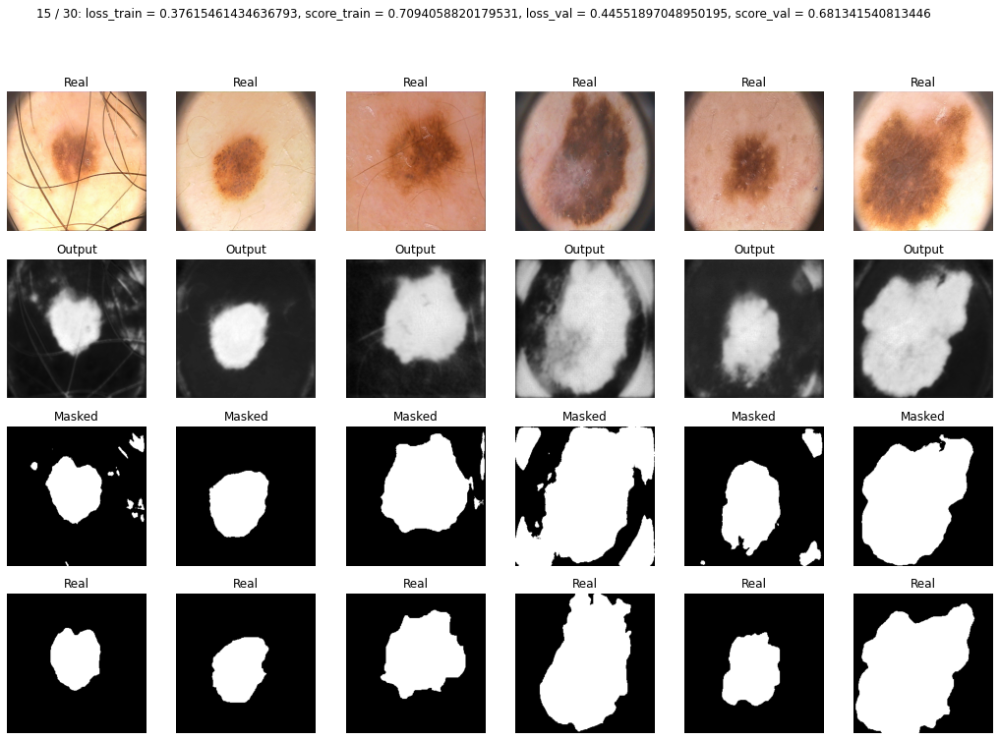

* Epoch 16/30
loss_train = 0.36736609254564556, score_train = 0.7904370682580131
loss_val= 0.40284923315048216, score_val = 0.7730407953262329


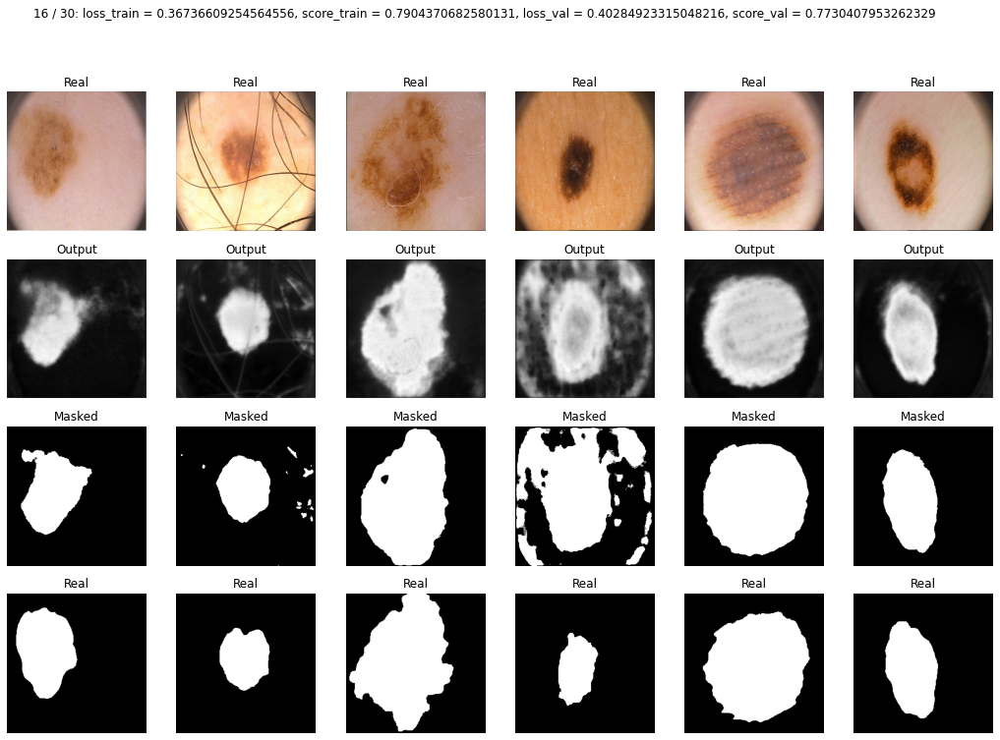

* Epoch 17/30
loss_train = 0.36828655855996273, score_train = 0.7244280747004918
loss_val= 0.4645715892314911, score_val = 0.695857584476471


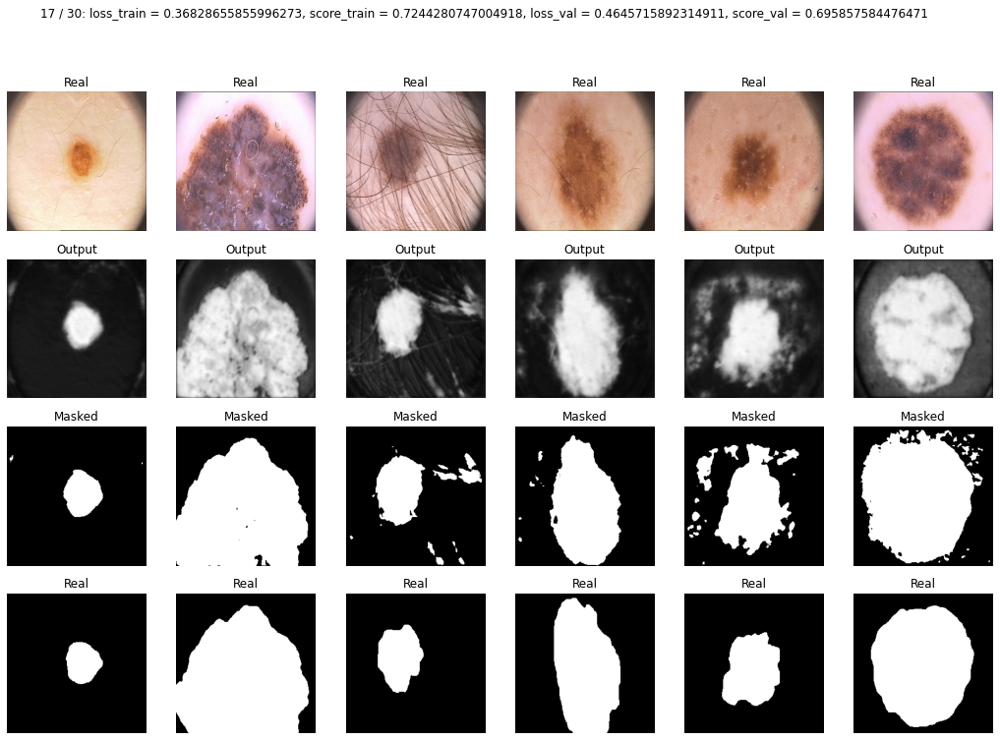

* Epoch 18/30
loss_train = 0.35701388120651245, score_train = 0.822120896407536
loss_val= 0.37724900245666504, score_val = 0.7980188012123108


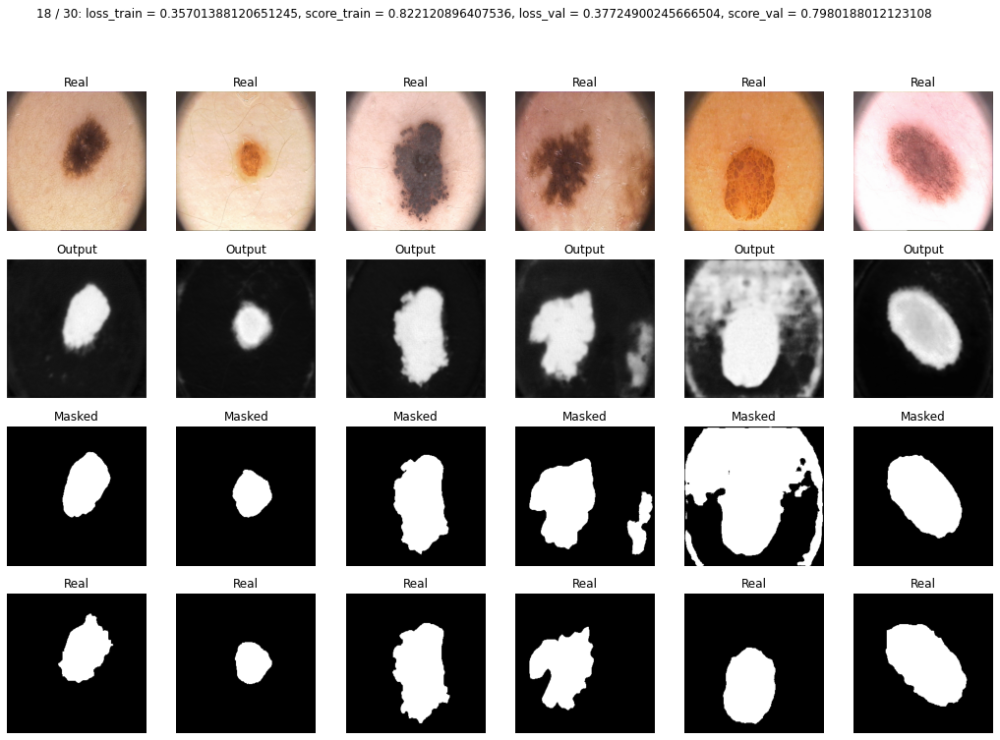

* Epoch 19/30
loss_train = 0.3655986360141209, score_train = 0.8166201455252511
loss_val= 0.3719998836517334, score_val = 0.7888456106185913


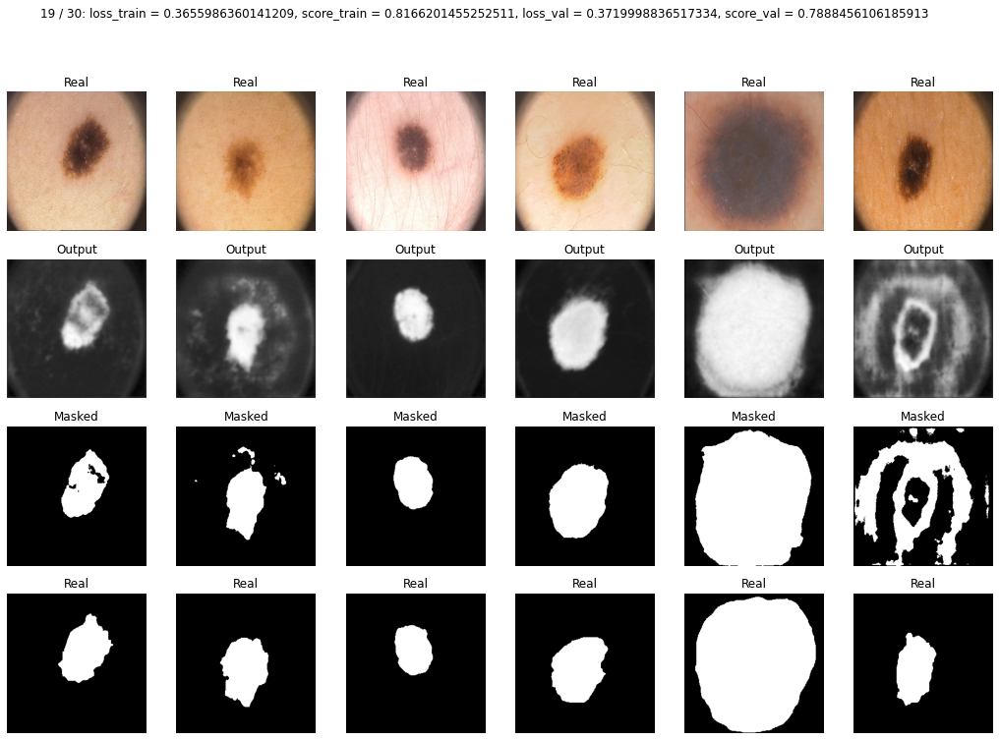

* Epoch 20/30
loss_train = 0.36945474999291555, score_train = 0.6835559265954154
loss_val= 0.441050523519516, score_val = 0.6601650714874268


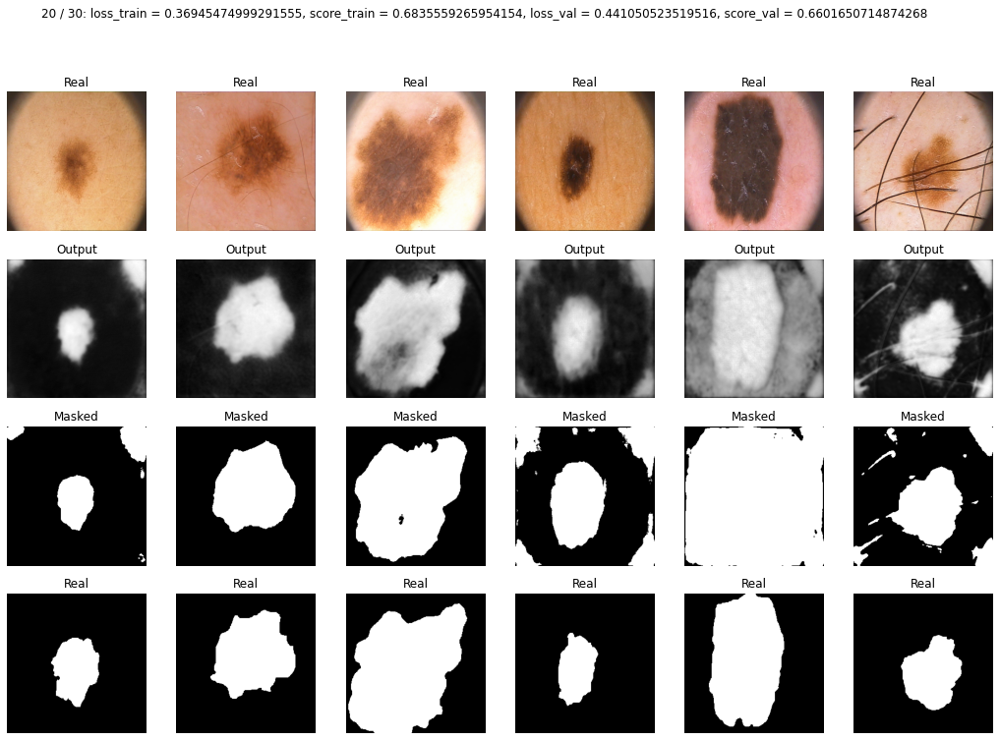

* Epoch 21/30


KeyboardInterrupt: ignored

In [ ]:
max_epochs = 30
optimizer_unet = torch.optim.Adam(unet_model.parameters(), lr = 0.001)
losses_train, scores_train, losses_val, scores_val = train(unet_model, optimizer_unet, bce_loss, max_epochs, data_tr, data_val)
#train(unet_model, optim.Adam(unet_model.parameters()), bce_loss, 20, data_tr, data_val)

In [ ]:
unet_model = UNet().to(device)

In [ ]:
max_epochs = 30
optimizer_unet = torch.optim.Adam(unet_model.parameters(), lr = 4e-4)
losses_train, scores_train, losses_val, scores_val = train(unet_model, optimizer_unet, bce_loss, max_epochs, data_tr, data_val)
#train(unet_model, optim.Adam(unet_model.parameters()), bce_loss, 20, data_tr, data_val)

In [ ]:
score_model(unet_model, iou_pytorch, data_val, device)

0.6860000371932984

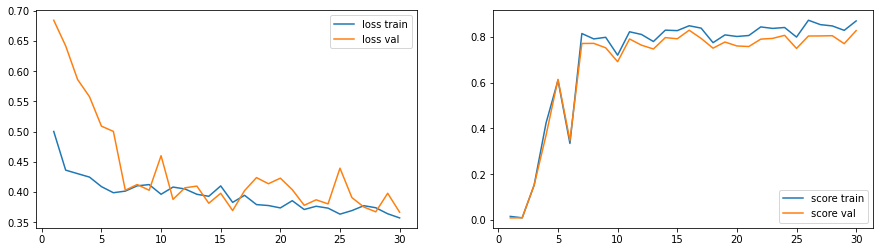

In [ ]:
plt_epochs = range(1,max_epochs+1)
fig, ax = plt.subplots(1,2, sharex = True)

ax[0].plot(plt_epochs, losses_train, label = 'loss train')
ax[0].plot(plt_epochs, losses_val, label = 'loss val')
ax[0].legend()
ax[1].plot(plt_epochs, scores_train, label = 'score train')
ax[1].plot(plt_epochs, scores_val, label = 'score val')
ax[1].legend()
plt.show()

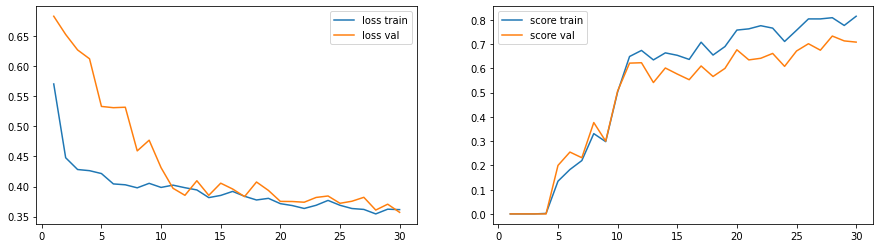

In [ ]:
plt_epochs = range(1,max_epochs+1)
fig, ax = plt.subplots(1,2, sharex = True)

ax[0].plot(plt_epochs, losses_train, label = 'loss train')
ax[0].plot(plt_epochs, losses_val, label = 'loss val')
ax[0].legend()
ax[1].plot(plt_epochs, scores_train, label = 'score train')
ax[1].plot(plt_epochs, scores_val, label = 'score val')
ax[1].legend()
plt.show()

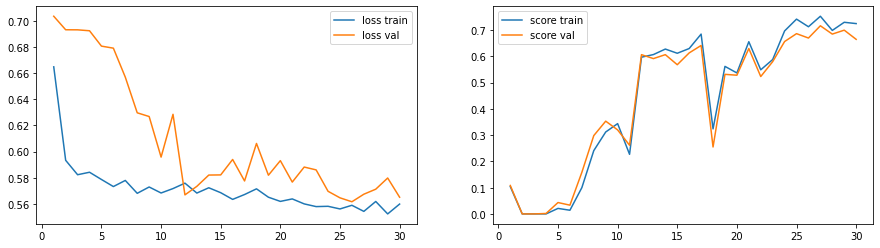

In [ ]:
plt_epochs = range(1,max_epochs+1)
fig, ax = plt.subplots(1,2, sharex = True)

ax[0].plot(plt_epochs, losses_train, label = 'loss train')
ax[0].plot(plt_epochs, losses_val, label = 'loss val')
ax[0].legend()
ax[1].plot(plt_epochs, scores_train, label = 'score train')
ax[1].plot(plt_epochs, scores_val, label = 'score val')
ax[1].legend()
plt.show()

In [ ]:
train(unet_model, optim.Adam(unet_model.parameters()), bce_loss, 20, data_tr, data_val)

In [ ]:
score_model(unet_model, iou_pytorch, data_val)

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [ ]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU()
        )
        self.pool0 = nn.Conv2d(64, 64, kernel_size=2, stride=2, padding=0) # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU()
        )
        self.pool1 = nn.Conv2d(128, 128, kernel_size=2, stride=2, padding=0) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
        )
        self.pool2 = nn.Conv2d(256, 256, kernel_size=2, stride=2, padding=0) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
        )
        self.pool3 = nn.Conv2d(512, 512, kernel_size=2, stride=2, padding=0) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 1024),
            nn.ReLU(),
            nn.Conv2d(1024, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
        )

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(512, 512, kernel_size=2, stride=2, padding=0) # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU()
        )
        self.upsample1 = nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2, padding=0) # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU()
        )
        self.upsample2 = nn.ConvTranspose2d(128, 128, kernel_size=2, stride=2, padding=0) # 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU()
        )
        self.upsample3 = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2, padding=0) # 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(64, 1, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features = 1),
            #nn.ReLU()
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e0_pool = self.pool0(e0)
        e1 = self.enc_conv1(e0_pool)
        e1_pool = self.pool1(e1)
        e2 = self.enc_conv2(e1_pool)
        e2_pool = self.pool2(e2)
        e3 = self.enc_conv3(e2_pool)
        e3_pool = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(e3_pool)

        # decoder
        d0 = self.upsample0(b)
        d0_conv = self.dec_conv0(torch.concat((d0, e3), axis=1))
        d1 = self.upsample1(d0_conv)
        d1_conv = self.dec_conv1(torch.concat((d1, e2), axis=1))
        d2 = self.upsample2(d1_conv)
        d2_conv = self.dec_conv2(torch.concat((d2, e1), axis=1))
        d3 =  self.upsample3(d2_conv)
        d3_conv = self.dec_conv3(torch.concat((d3, e0), axis=1)) # no activation
        return d3_conv

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
unet2_model = UNet2().to(device)


* Epoch 1/30
loss_train = 0.5027875389371599, score_train = 0.0
loss_val= 0.6654799103736877, score_val = 0.0


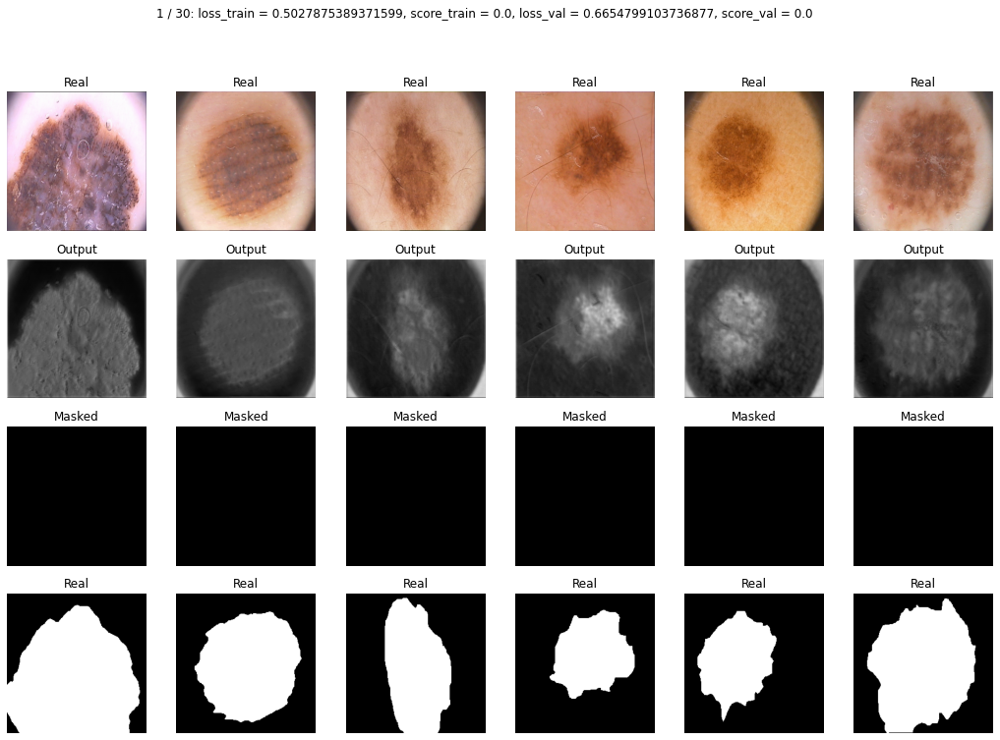

* Epoch 2/30
loss_train = 0.4508546548230308, score_train = 0.006250000026609216
loss_val= 0.641266667842865, score_val = 0.0


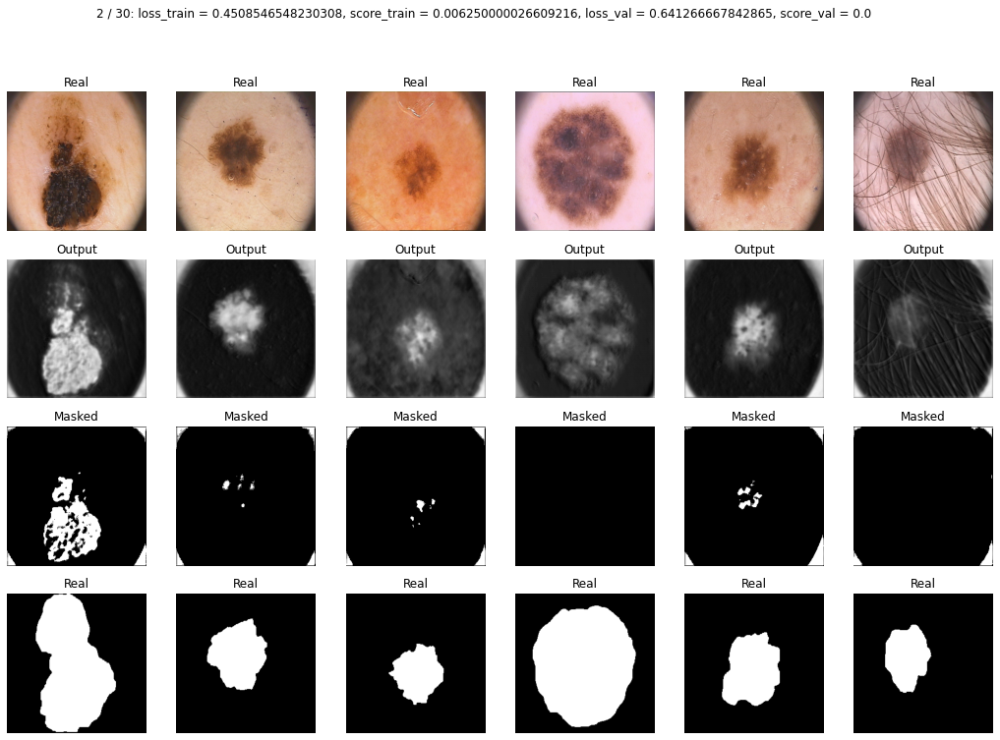

* Epoch 3/30
loss_train = 0.44276747533253263, score_train = 0.04910714352237327
loss_val= 0.5987134456634522, score_val = 0.012000000849366189


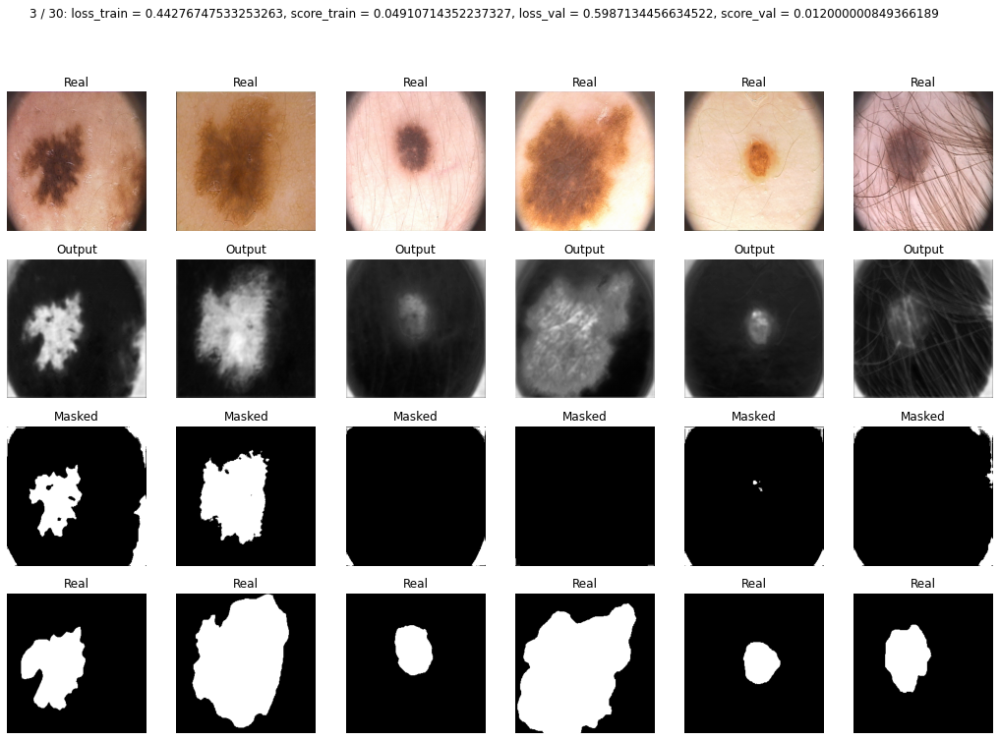

* Epoch 4/30
loss_train = 0.4381299657481057, score_train = 0.1098214318709714
loss_val= 0.5771231889724732, score_val = 0.10000000521540642


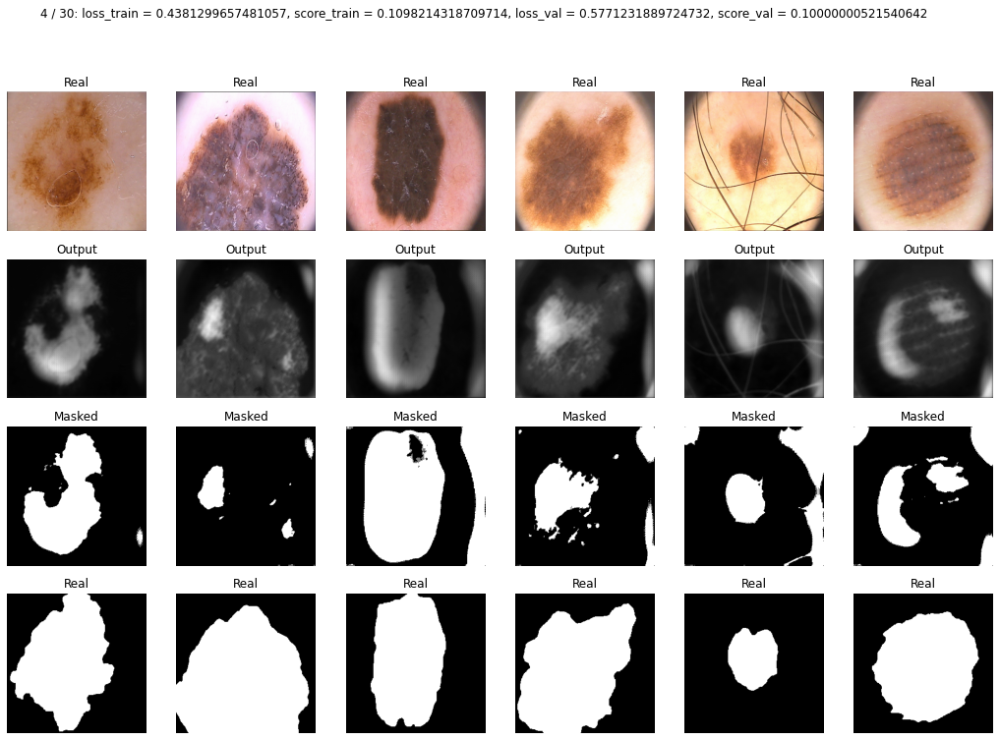

* Epoch 5/30
loss_train = 0.42240420835358755, score_train = 0.44642858845846994
loss_val= 0.47864274382591243, score_val = 0.4199999988079071


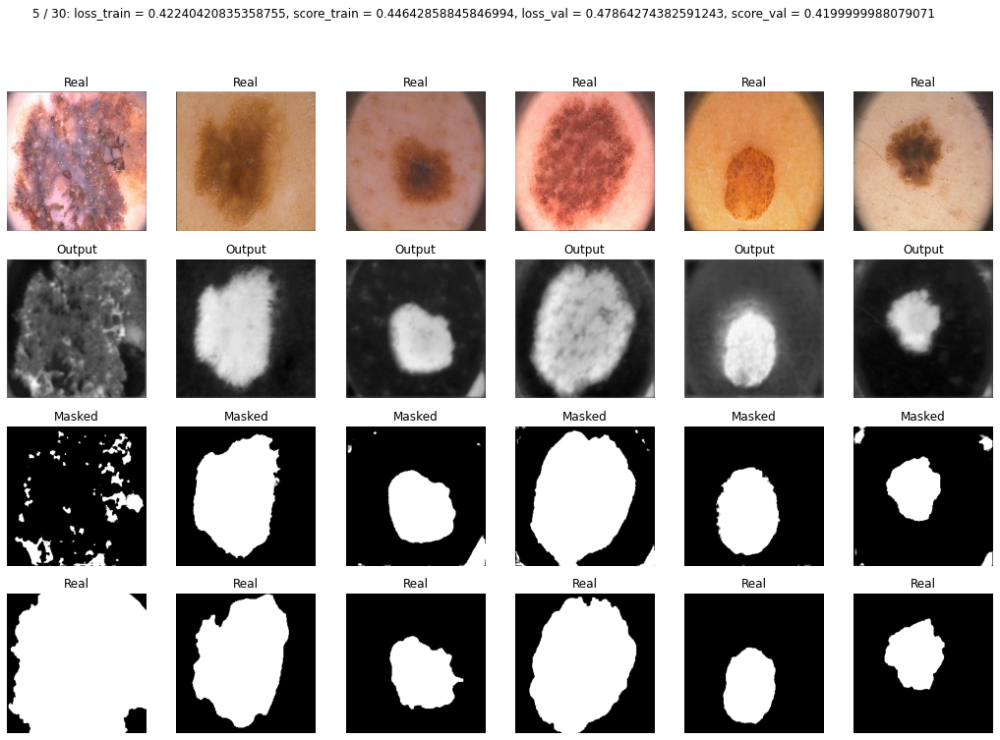

* Epoch 6/30
loss_train = 0.418970342193331, score_train = 0.5794643078531537
loss_val= 0.4240427255630493, score_val = 0.5400000214576721


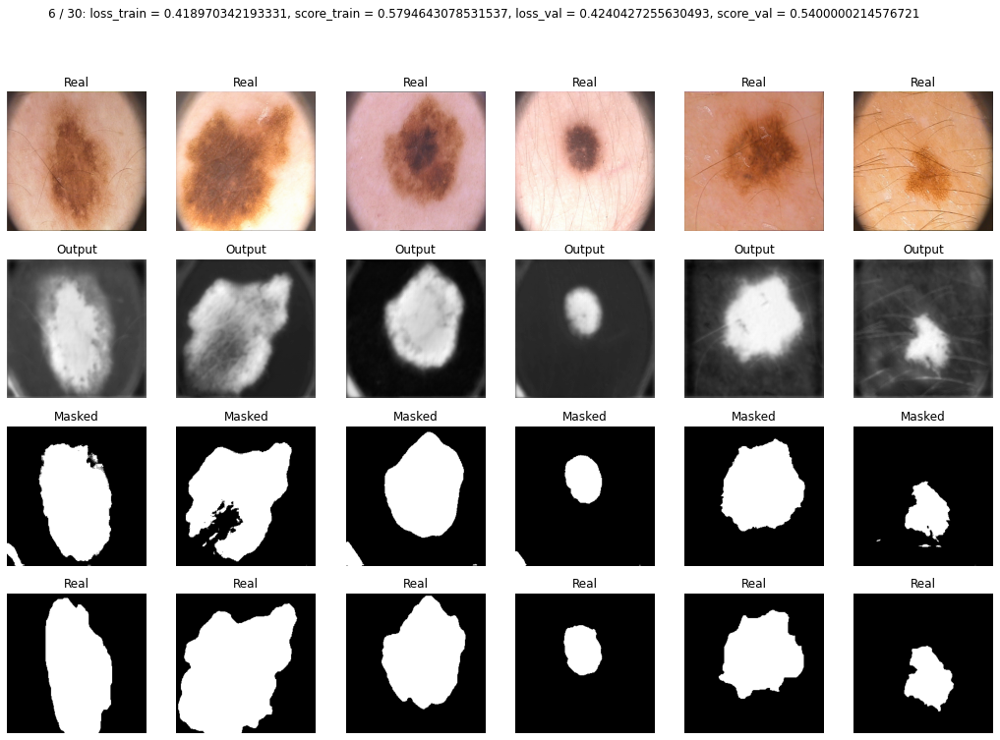

* Epoch 7/30
loss_train = 0.4148605849061694, score_train = 0.37321429380348753
loss_val= 0.48730190396308903, score_val = 0.3460000067949295


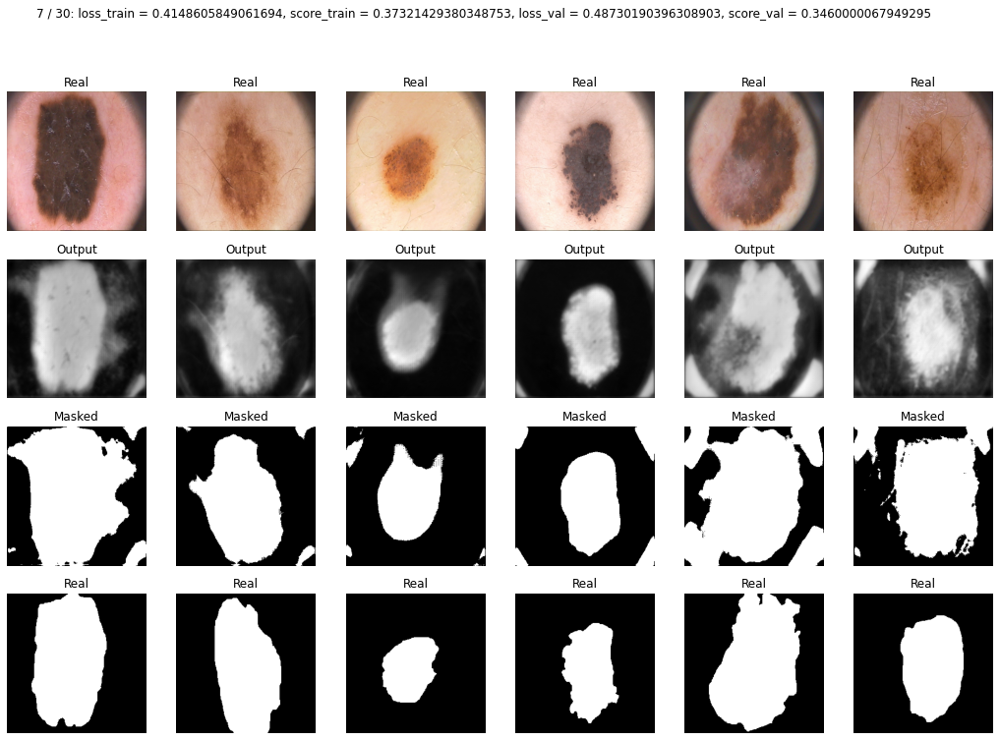

* Epoch 8/30
loss_train = 0.40780697975839886, score_train = 0.4767857151372092
loss_val= 0.4882771790027618, score_val = 0.4100000083446503


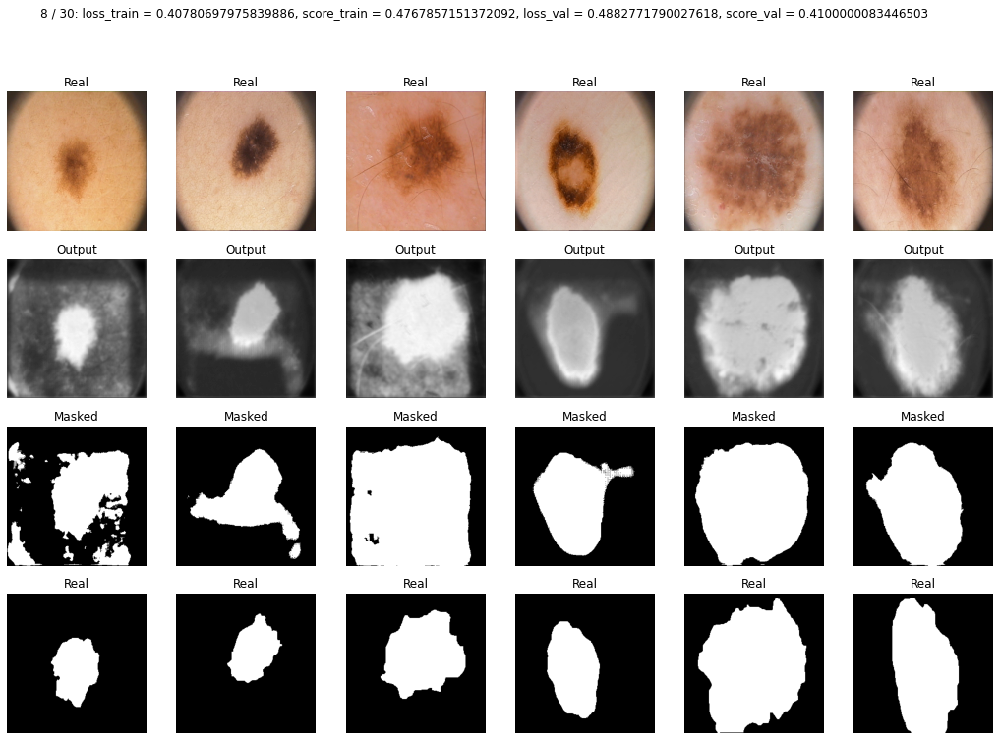

* Epoch 9/30
loss_train = 0.4010482345308576, score_train = 0.5446428486279079
loss_val= 0.4896871209144592, score_val = 0.5080000281333923


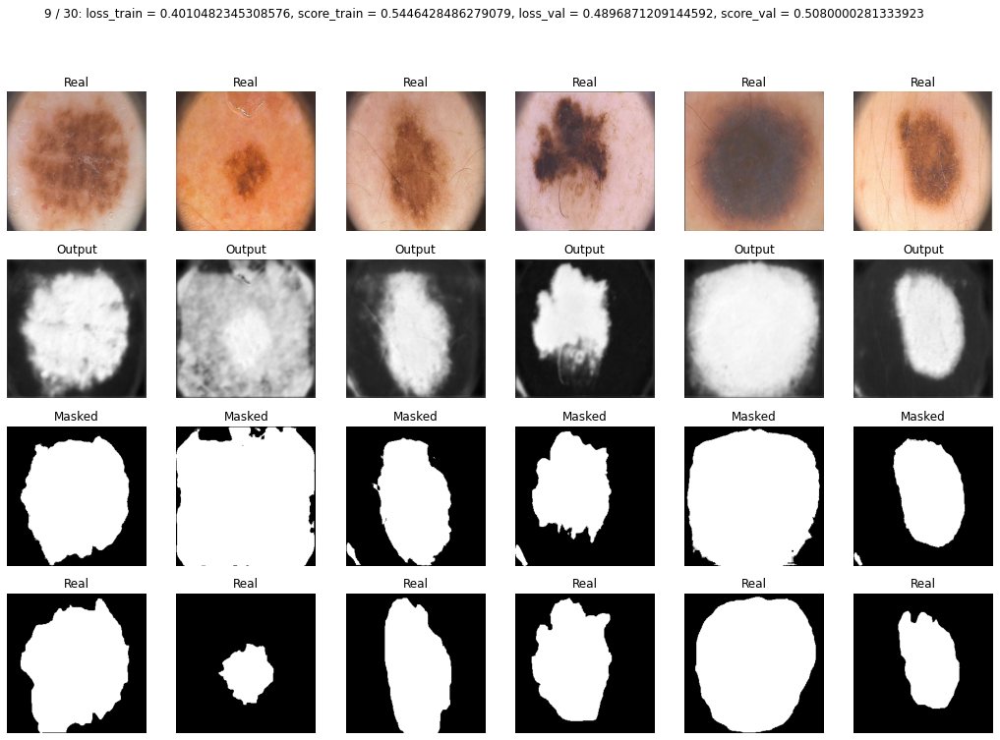

* Epoch 10/30
loss_train = 0.3990069031715393, score_train = 0.45446428656578064
loss_val= 0.5390350818634033, score_val = 0.41799999475479127


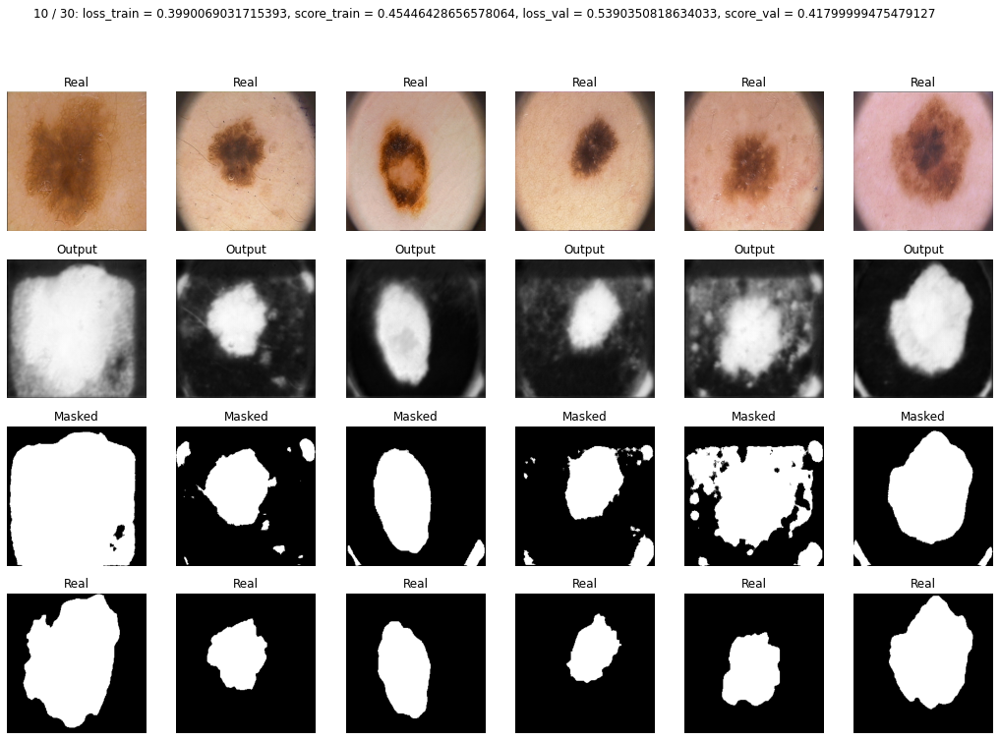

* Epoch 11/30
loss_train = 0.4059063196182251, score_train = 0.5446428528853825
loss_val= 0.507317328453064, score_val = 0.49200003743171694


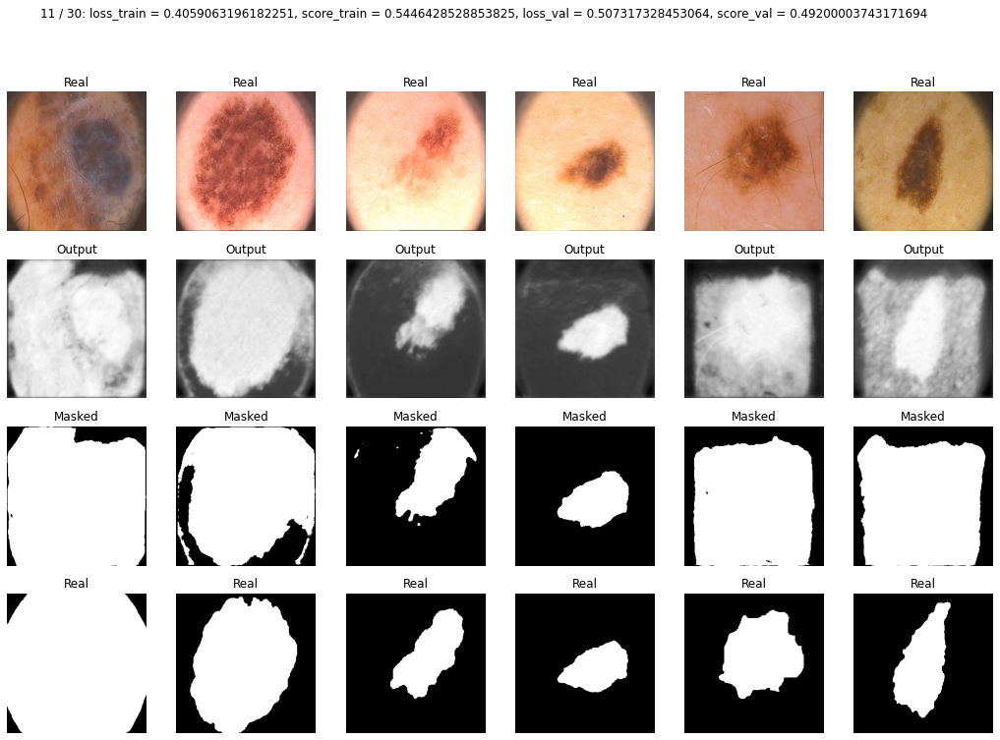

* Epoch 12/30
loss_train = 0.3813731712954385, score_train = 0.643750011920929
loss_val= 0.4199412226676942, score_val = 0.6220000386238098


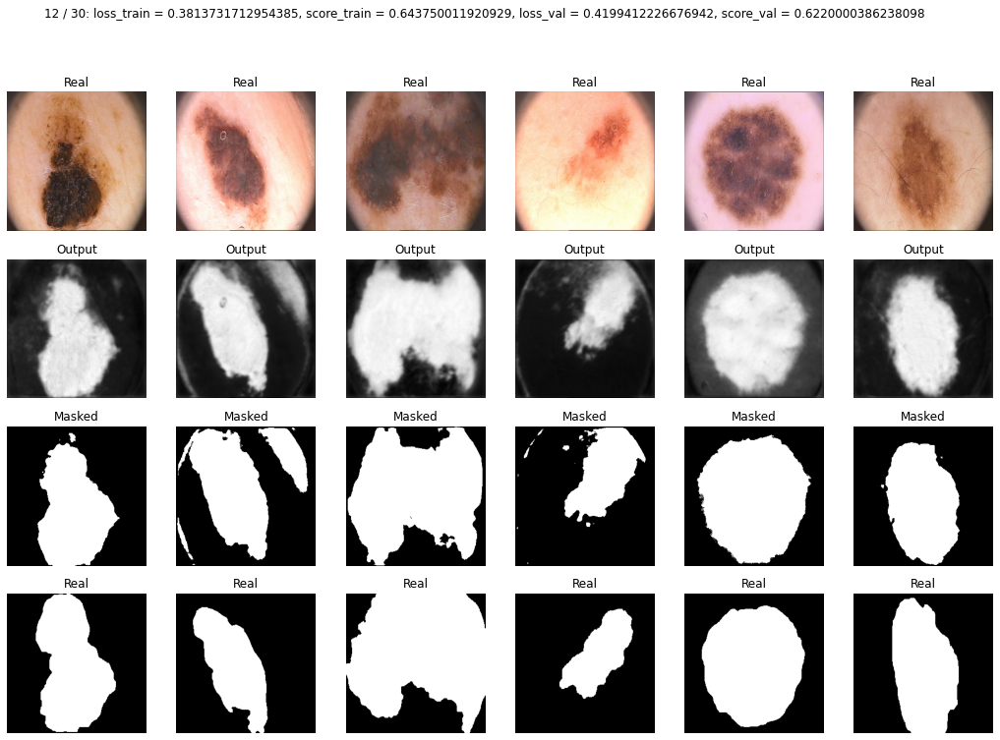

* Epoch 13/30
loss_train = 0.38400806699480333, score_train = 0.6928571462631226
loss_val= 0.4104527711868286, score_val = 0.6360000193119049


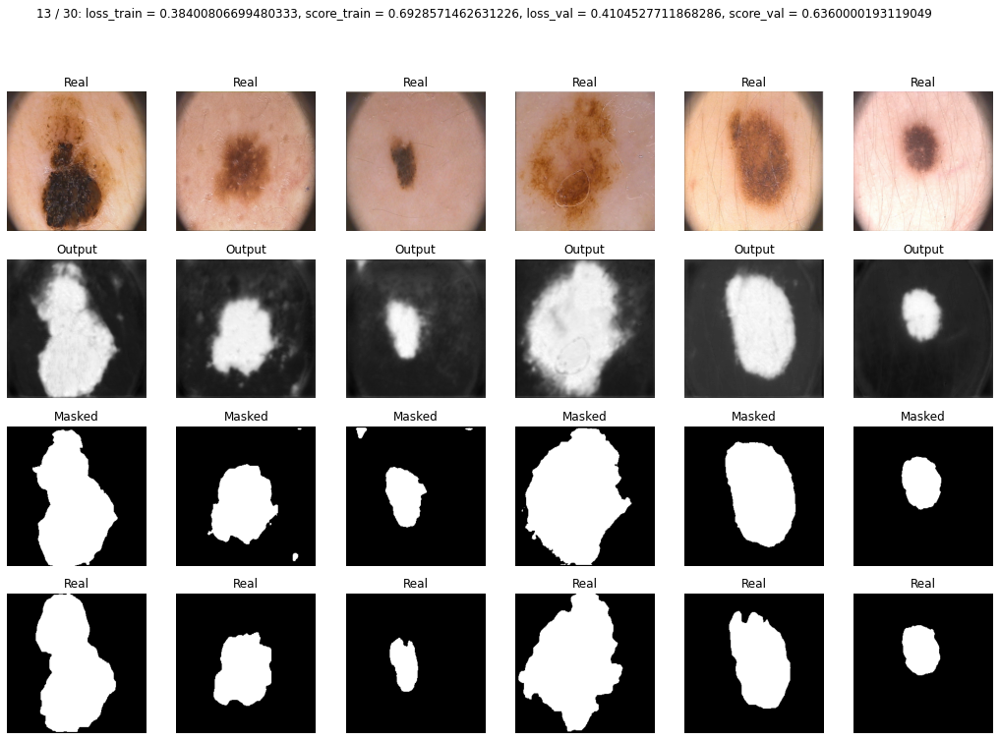

* Epoch 14/30
loss_train = 0.38348573020526344, score_train = 0.7348214302744184
loss_val= 0.3822402596473694, score_val = 0.6860000252723694


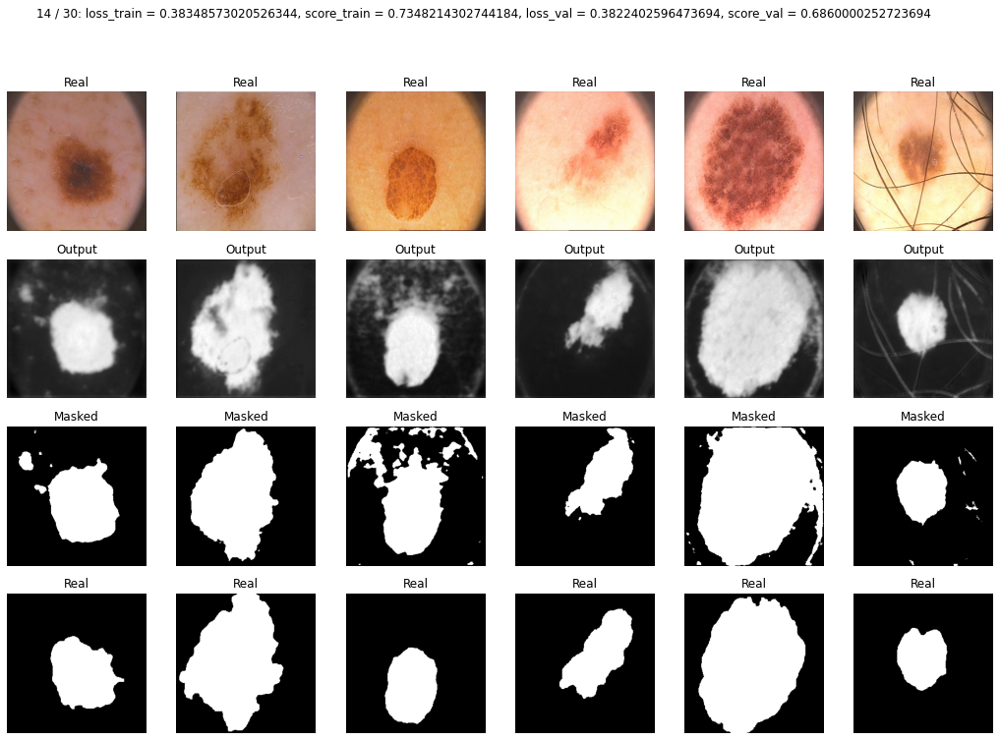

* Epoch 15/30
loss_train = 0.40434526545660837, score_train = 0.6776785935674395
loss_val= 0.3994543790817261, score_val = 0.6200000166893005


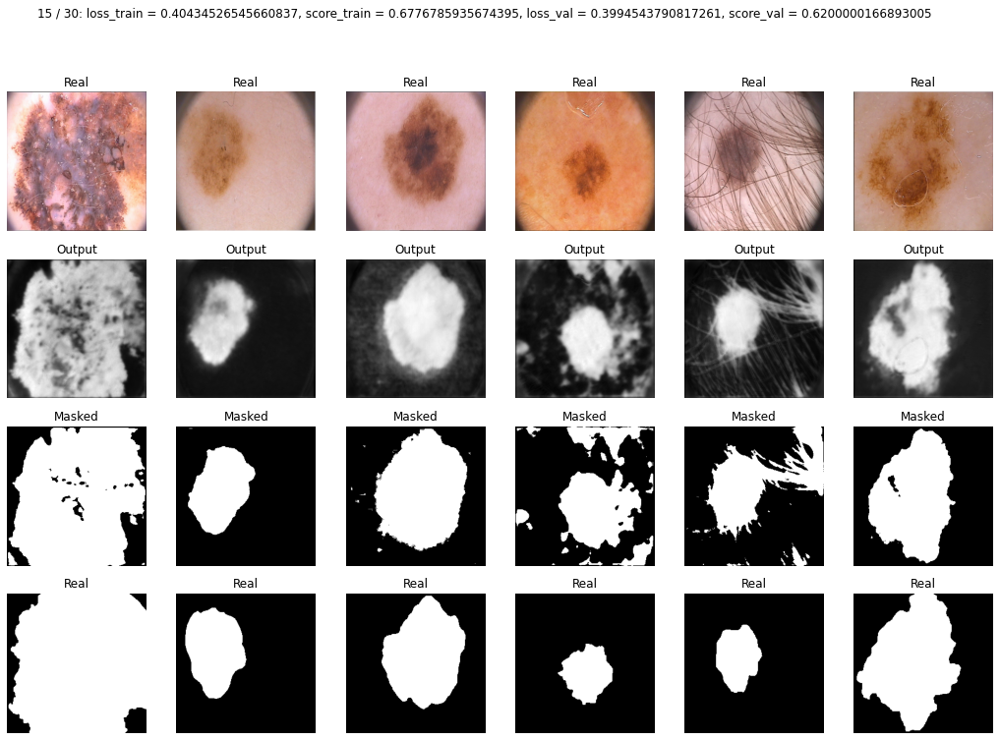

* Epoch 16/30
loss_train = 0.4116366718496595, score_train = 0.6151785765375409
loss_val= 0.4001140296459198, score_val = 0.55600004196167


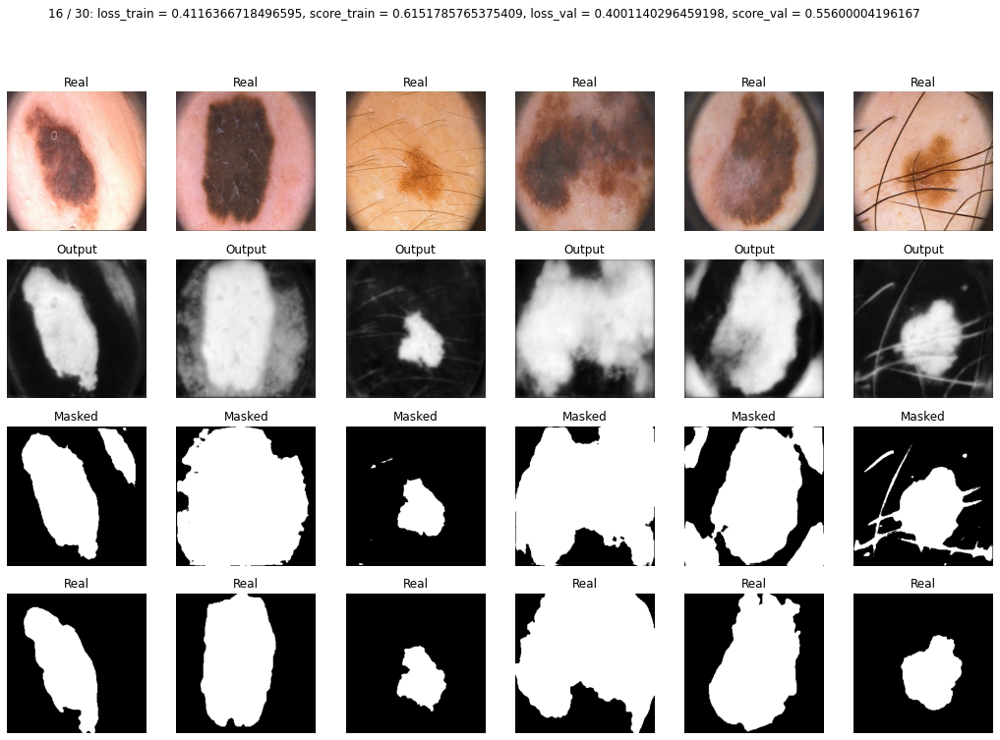

* Epoch 17/30
loss_train = 0.3965283376829965, score_train = 0.5464285782405308
loss_val= 0.4387803733348846, score_val = 0.4860000014305115


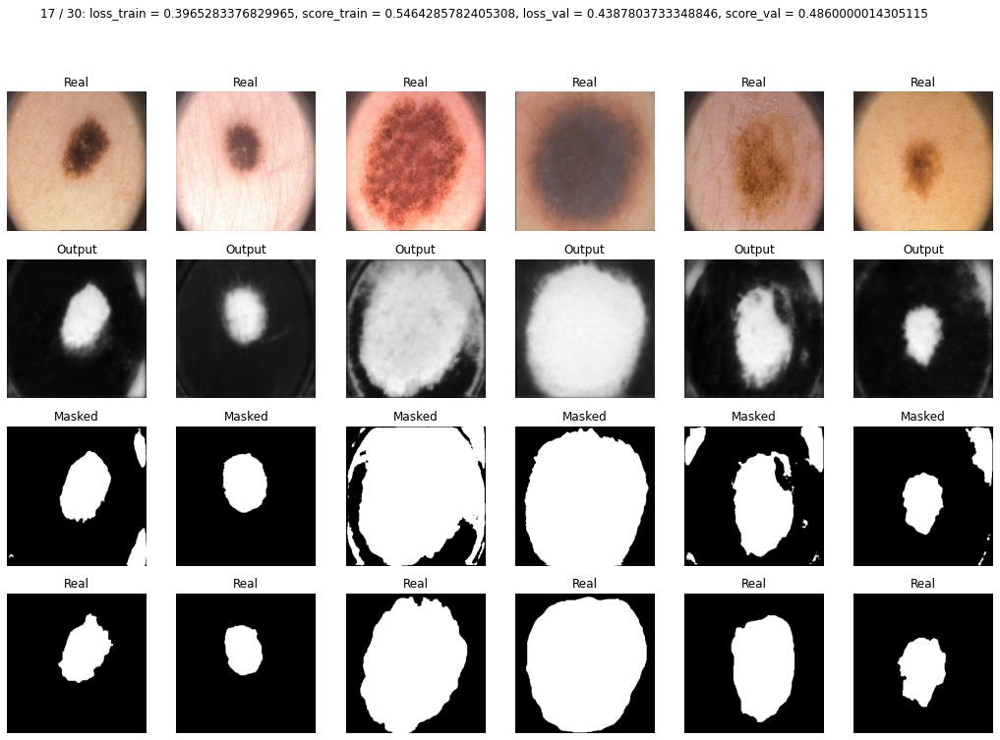

* Epoch 18/30


KeyboardInterrupt: ignored

In [ ]:
max_epochs = 30
optimizer_unet = torch.optim.Adam(unet2_model.parameters(), lr = 4e-4)
losses_train, scores_train, losses_val, scores_val = train(unet2_model, optimizer_unet, bce_loss, max_epochs, data_tr, data_val)
#train(unet_model, optim.Adam(unet_model.parameters()), bce_loss, 20, data_tr, data_val)